In [1]:
import scanpy as sc
import anndata as ad
from scipy import io
import numpy as np
import pandas as pd
import scvelo as scv
import cellrank as cr
from gprofiler import GProfiler

In [2]:
scv.settings.verbosity = 2
scv.settings.presenter_view = True
scv.settings.set_figure_params('scvelo',dpi_save=300, fontsize=6, figsize=(4,4))
scv.settings.plot_prefix = 'keratinocyte_uninfected/'
cr.settings.verbosity = 2

In [3]:
palette = ["#A6CEE3", "#1F78B4", "#B2DF8A", "#33A02C", "#FB9A99", "#E31A1C", "#FDBF6F", "#FF7F00", "#CAB2D6", "#6A3D9A", "#FFFF99", "#B15928"]

In [4]:
X = io.mmread("data/uninfected_keratinocyte_counts.mtx")

In [5]:
adata = ad.AnnData(X=X.transpose().tocsr(), dtype=X.dtype)

# load cell metadata pre-calculated in Seurat:
cell_meta = pd.read_csv("data/uninfected_keratinocyte_metadata.csv")

# load gene names pre-calculated in Seurat:
with open("data/uninfected_keratinocyte_gene_names.csv", 'r') as f:
    gene_names = f.read().splitlines()

# load barcodes pre-calculated in Seurat:
adata.obs = cell_meta
adata.obs.index = adata.obs['barcode']
adata.var.index = gene_names

# load dimensional reduction pre-calculated in Seurat:
pca = pd.read_csv("data/uninfected_keratinocyte_pca.csv")
pca.index = adata.obs.index

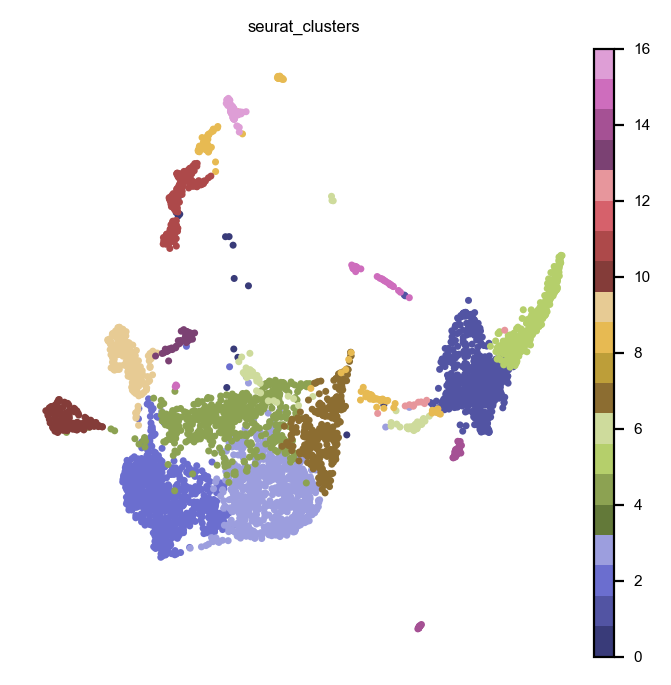

In [6]:
# set pca and umap pre-calculated in Seurat:
adata.obsm['X_pca'] = pca.to_numpy()
adata.obsm['X_umap'] = np.vstack((adata.obs['UMAP_1'].to_numpy(), adata.obs['UMAP_2'].to_numpy())).T

# plot a UMAP colored by celltypes to test:
sc.pl.umap(adata, color='seurat_clusters', frameon=False, cmap='tab20b')

In [7]:
# read .loom files created in velocyto for each sample in the integrated dataset
ldata1 = scv.read('loom/uninfected_1.loom', cache=False, validate=False)
ldata2 = scv.read('loom/uninfected_2.loom', cache=False, validate=False)

/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [8]:
# rename barcodes in order to merge
barcodes = [bc.split(':')[1] for bc in ldata1.obs.index.tolist()]
barcodes = [bc[0:len(bc)-1] + '_1' for bc in barcodes]
ldata1.obs.index = barcodes

barcodes = [bc.split(':')[1] for bc in ldata2.obs.index.tolist()]
barcodes = [bc[0:len(bc)-1] + '_2' for bc in barcodes]
ldata2.obs.index = barcodes

ldata1.var_names_make_unique()
ldata2.var_names_make_unique()

# concatenate loom data
ldata = ldata1.concatenate(ldata2)

scv.utils.clean_obs_names(adata)
scv.utils.clean_obs_names(ldata)

# merge matrices into the original adata object
adata = scv.utils.merge(adata, ldata)

# save dataset as anndata format
adata.write('adata/uninfected_keratinocyte.h5ad')

# scVelo

In [9]:
#adata = scv.read('adata/uninfected_keratinocyte.h5ad')

scv.pp.filter_and_normalize(adata, min_shared_counts=20, n_top_genes=2000)
sc.tl.pca(adata)
sc.pp.neighbors(adata, n_pcs=14, n_neighbors=30)
scv.pp.moments(adata, n_pcs=None, n_neighbors=None)

scv.tl.recover_dynamics(adata, n_jobs=10)

scv.tl.velocity(adata, mode = 'dynamical', n_jobs = 10)
scv.tl.velocity_graph(adata, n_jobs = 10)

# save for later
adata.write('processed_adata/uninfected_keratinocyte.h5ad', compression='gzip')

Filtered out 16103 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 2000 highly variable genes.
computing moments based on connectivities
    finished (0:00:00)
recovering dynamics (using 10/12 cores)


  0%|          | 0/675 [00:00<?, ?gene/s]

/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/scvelo/tools/dynamical_model.py:721: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array([dm.alpha, dm.beta, dm.gamma, dm.pars[:3]]) / dm.m[-1]
/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/scvelo/tools/dynamical_model.py:724: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array([dm.t, dm.tau, dm.t_, dm.pars[4]]) * dm.m[-1]


    finished (0:01:03)
computing velocities
    finished (0:00:03)
computing velocity graph (using 10/12 cores)


  0%|          | 0/4705 [00:00<?, ?cells/s]

/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/scvelo/core/_parallelize.py:138: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = np.array(res) if as_array else res


    finished (0:00:04)


In [10]:
#adata = scv.read('processed_adata/uninfected_keratinocyte.h5ad')

computing velocity embedding
    finished (0:00:00)
saving figure to file ./figures/keratinocyte_uninfected/velocity_stream.svg


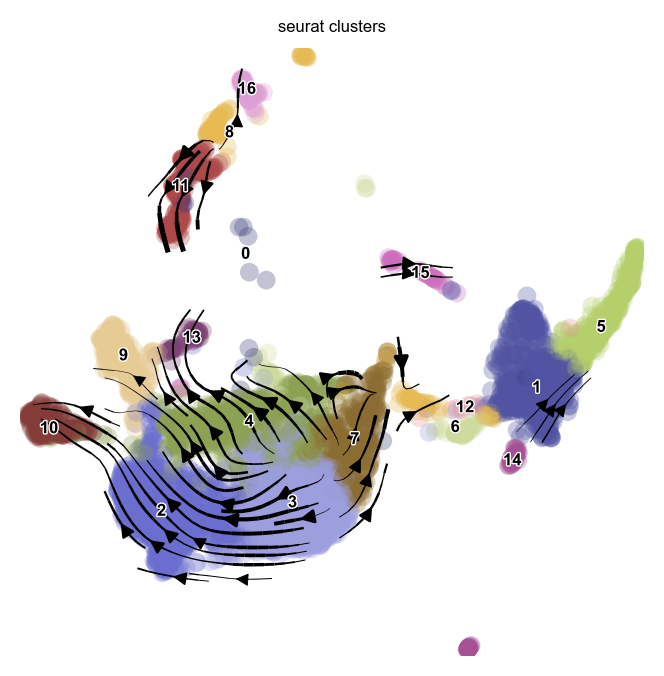

In [11]:
scv.pl.velocity_embedding_stream(adata,
                                 basis = 'umap',
                                 smooth = 0.8,
                                 min_mass = 4,
                                 color = 'seurat_clusters',
                                 palette='tab20b',
                                 save = 'velocity_stream.svg'
                                )

## CellRank

In [12]:
scv.tl.latent_time(adata)

computing terminal states
    identified 5 regions of root cells and 2 regions of end points .
    finished (0:00:00)
computing latent time using root_cells as prior
    finished (0:00:01)


In [13]:
cr.tl.terminal_states(adata,
                      cluster_key="seurat_clusters",
                      weight_connectivities=0.2)

cr.tl.initial_states(adata, cluster_key = 'seurat_clusters')

cr.tl.lineages(adata)

scv.tl.recover_latent_time(adata,
                           root_key="initial_states_probs",
                           end_key="terminal_states_probs")

scv.tl.paga(adata,
            groups="seurat_clusters",
            root_key="initial_states_probs",
            end_key="terminal_states_probs",
            use_time_prior="velocity_pseudotime")

cr.pl.cluster_fates(adata,
                    mode="paga_pie",
                    cluster_key="seurat_clusters",
                    basis="umap",
                    legend_kwargs={"loc": "top right out"},
                    legend_loc="top left out",
                    node_size_scale=5,
                    edge_width_scale=1,
                    max_edge_width=4,
                    title="directed PAGA",
                    save = 'keratinocyte_uninfected/cluster_fates.pdf'
                   )

Accessing `adata.obsp['T_fwd']`
Computing transition matrix based on logits using `'deterministic'` mode


/var/folders/9b/399_qf9s3gz9j3f1l6bkpm0m0000gp/T/ipykernel_79101/1350283535.py:1: DeprecationWarning: `cellrank.tl.terminal_states` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  cr.tl.terminal_states(adata,
/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/cellrank/tl/_init_term_states.py:156: DeprecationWarning: `cellrank.tl.transition_matrix` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  kernel = transition_matrix(


Estimating `softmax_scale` using `'deterministic'` mode


  0%|          | 0/4705 [00:00<?, ?cell/s]

Setting `softmax_scale=3.8365`


  0%|          | 0/4705 [00:00<?, ?cell/s]

    Finish (0:00:04)
Using a connectivity kernel with weight `0.2`
Computing transition matrix based on `adata.obsp['connectivities']`
    Finish (0:00:00)
Computing eigendecomposition of the transition matrix
Adding `adata.uns['eigendecomposition_fwd']`
       `.eigendecomposition`
    Finish (0:00:00)
Computing Schur decomposition
Adding `adata.uns['eigendecomposition_fwd']`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:36)
Computing `2` macrostates
Adding `.macrostates`
       `.macrostates_memberships`
       `.coarse_T`
       `.coarse_initial_distribution
       `.coarse_stationary_distribution`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:01)
Adding `adata.obs['terminal_states']`
       `adata.obs['terminal_states_probs']`
       `.terminal_states`
       `.terminal_states_probabilities`
       `.terminal_states_memberships
    Finish`
Accessing `adata.obsp['T_bwd']`
Computing transiti

/var/folders/9b/399_qf9s3gz9j3f1l6bkpm0m0000gp/T/ipykernel_79101/1350283535.py:5: DeprecationWarning: `cellrank.tl.initial_states` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  cr.tl.initial_states(adata, cluster_key = 'seurat_clusters')
/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/cellrank/tl/_init_term_states.py:156: DeprecationWarning: `cellrank.tl.transition_matrix` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  kernel = transition_matrix(


Estimating `softmax_scale` using `'deterministic'` mode


  0%|          | 0/4705 [00:00<?, ?cell/s]

Setting `softmax_scale=3.8365`


  0%|          | 0/4705 [00:00<?, ?cell/s]

    Finish (0:00:06)
Using a connectivity kernel with weight `0.2`
Computing transition matrix based on `adata.obsp['connectivities']`
    Finish (0:00:00)
Computing eigendecomposition of the transition matrix
Adding `adata.uns['eigendecomposition_bwd']`
       `.eigendecomposition`
    Finish (0:00:00)
Computing Schur decomposition
Adding `adata.uns['eigendecomposition_bwd']`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:35)
Computing `2` macrostates
Adding `.macrostates`
       `.macrostates_memberships`
       `.coarse_T`
       `.coarse_initial_distribution
       `.coarse_stationary_distribution`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:01)
Adding `adata.obs['initial_states']`
       `adata.obs['initial_states_probs']`
       `.terminal_states`
       `.terminal_states_probabilities`
       `.terminal_states_memberships
    Finish`
Computing absorption probabilities
Defaulting to `'g

/var/folders/9b/399_qf9s3gz9j3f1l6bkpm0m0000gp/T/ipykernel_79101/1350283535.py:7: DeprecationWarning: `cellrank.tl.lineages` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  cr.tl.lineages(adata)


  0%|          | 0/2 [00:00<?, ?/s]

Adding `adata.obsm['to_terminal_states']`
       `.absorption_probabilities`
    Finish (0:00:00)
computing latent time using initial_states_probs, terminal_states_probs as prior
    finished (0:00:01)
running PAGA using priors: ['velocity_pseudotime', 'initial_states_probs', 'terminal_states_probs']


KeyError: 'Attribute does not exist'

In [14]:
cr.tl.lineage_drivers(adata)

Adding `adata.varm['terminal_lineage_drivers']`
       `.lineage_drivers`
    Finish (0:00:00)


/var/folders/9b/399_qf9s3gz9j3f1l6bkpm0m0000gp/T/ipykernel_79101/775505281.py:1: DeprecationWarning: `cellrank.tl.lineage_drivers` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  cr.tl.lineage_drivers(adata)


,14_corr,14_pval,14_qval,14_ci_low,14_ci_high,10_corr,10_pval,10_qval,10_ci_low,10_ci_high
Hbb-bs,0.988529,0.000000e+00,0.000000,0.987858,0.989163,-0.988529,0.000000e+00,0.000000,-0.989163,-0.987858
Hbb-bt,0.916820,0.000000e+00,0.000000,0.912142,0.921260,-0.916820,0.000000e+00,0.000000,-0.921260,-0.912141
Rsad2,0.081007,2.592855e-08,0.000017,0.052553,0.109329,-0.081016,2.583688e-08,0.000017,-0.109338,-0.052562
Plaat3,0.021190,1.461572e-01,0.760866,-0.007390,0.049735,-0.021193,1.461095e-01,0.761353,-0.049738,0.007387
Ska3,0.016328,2.628409e-01,0.766746,-0.012253,0.044882,-0.016327,2.628448e-01,0.766712,-0.044882,0.012253
...,...,...,...,...,...,...,...,...,...,...
Sgms1,-0.037473,1.014747e-02,0.760866,-0.065977,-0.008907,0.037474,1.014587e-02,0.761353,0.008908,0.065978
Akap13,-0.037677,9.744081e-03,0.760866,-0.066181,-0.009112,0.037670,9.758248e-03,0.761353,0.009104,0.066174
Ptprg,-0.037976,9.178240e-03,0.760866,-0.066479,-0.009412,0.037975,9.181480e-03,0.761353,0.009410,0.066478
Fabp5,-0.041060,4.845971e-03,0.760866,-0.069553,-0.012499,0.041061,4.844341e-03,0.761353,0.012501,0.069555


/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/scvelo/plotting/utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()
/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/scvelo/plotting/utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()
/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/scvelo/plotting/utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()
/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/scvelo/plotting/utils.py:869: MatplotlibDeprecationWarning: The draw_all functi

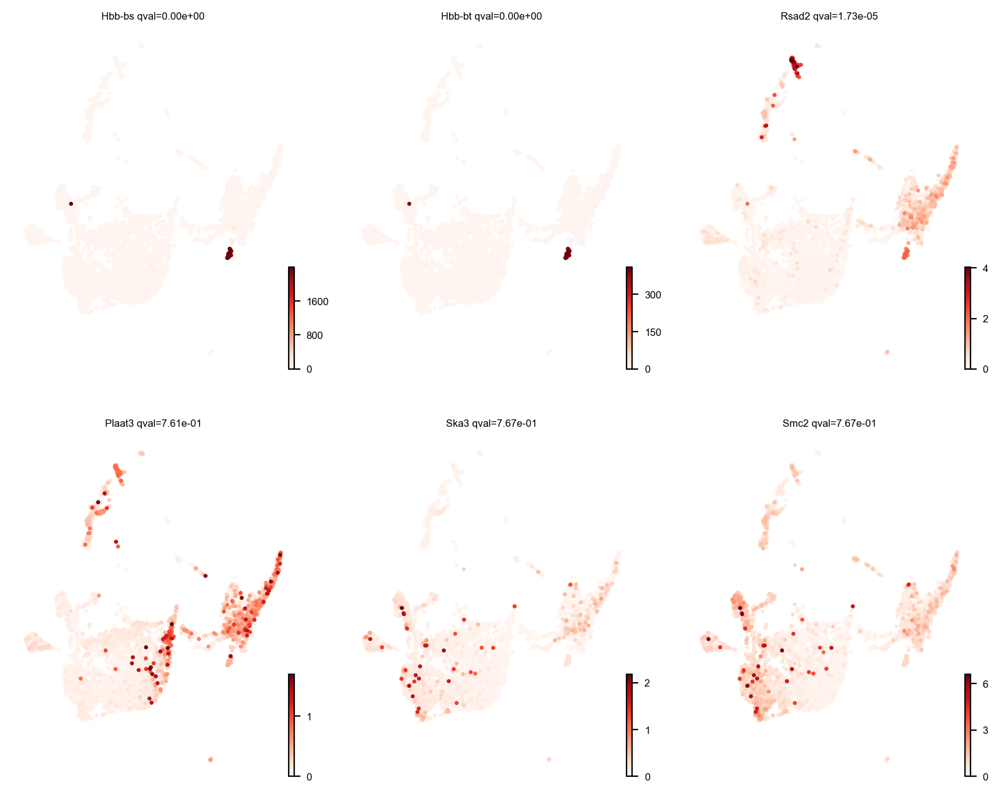

In [15]:
cr.pl.lineage_drivers(adata,
                      lineage = '14',
                      n_genes = 6,
                      ncols = 3,
                      title_fmt='{gene} qval={qval:.2e}',
                      save = 'keratinocyte_uninfected/lineage_drivers_rescaled.pdf',
                      color_map = 'Reds',
                      figsize=(10,8),
                      smooth = True,
                      wspace = 5,
                     )

/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/scvelo/plotting/scatter.py:614: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(
/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/scvelo/plotting/scatter.py:614: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(
/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/scvelo/plotting/utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()
/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/scvelo/plotting/utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()


saving figure to file ./figures/keratinocyte_uninfected/root_latent_dpt.pdf


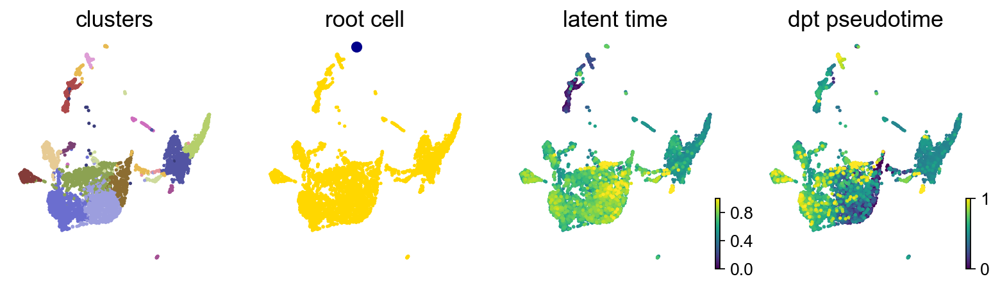

In [16]:
## compute DPT, starting from CellRank defined root cell
root_idx = np.where(adata.obs["initial_states"] == "7")[0][0]
adata.uns["iroot"] = root_idx
sc.tl.diffmap(adata)
sc.tl.dpt(adata)

scv.pl.scatter(adata,
               color = ["seurat_clusters", root_idx, "latent_time", "dpt_pseudotime"],
               fontsize = 16,
               cmap = "viridis",
               perc = [2, 98],
               colorbar = True,
               rescale_color = [0, 1],
               title = ["clusters", "root cell", "latent time", "dpt pseudotime"],
               save = 'root_latent_dpt.pdf'
              )

Computing trends using `10` core(s)


  0%|          | 0/6 [00:00<?, ?gene/s]

    Finish (0:00:33)
Plotting trends


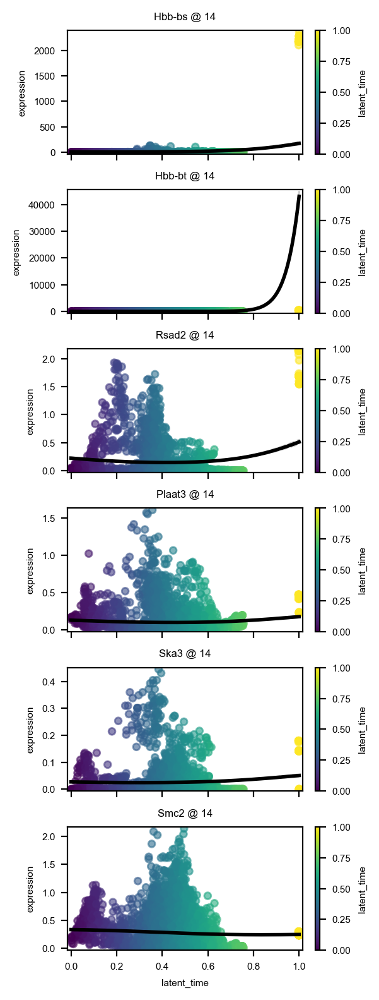

In [17]:
model = cr.ul.models.GAM(adata)

genes = adata.varm['terminal_lineage_drivers']["14_corr"].sort_values(ascending=False).index[:6]

cr.pl.gene_trends(adata,
                  model = model,
                  data_key = "Ms",
                  genes = genes,
                  lineages = '14',
                  time_key = "latent_time",
                  same_plot = False,
                  hide_cells = False,
                  show_progress_bar = False,
                  figsize = (3, 8),
                  gene_as_title = True,
                  cell_color = 'latent_time',
                  n_jobs = 10,
                  save = 'keratinocyte_uninfected/gene_trends.pdf'
                 )

Computing trends using `1` core(s)


  0%|          | 0/100 [00:00<?, ?gene/s]

/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/pygam/utils.py:649: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  bases = (x >= aug_knots[:-1]).astype(np.int) * \
/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/pygam/utils.py:650: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish

    Finish (0:00:09)


,14
0,Xkr4
1,Col5a2
2,Col3a1
3,Gulp1
4,Spats2l
...,...
95,R3hdm1
96,Il1r2
97,Serpinb3b
98,Acsl3


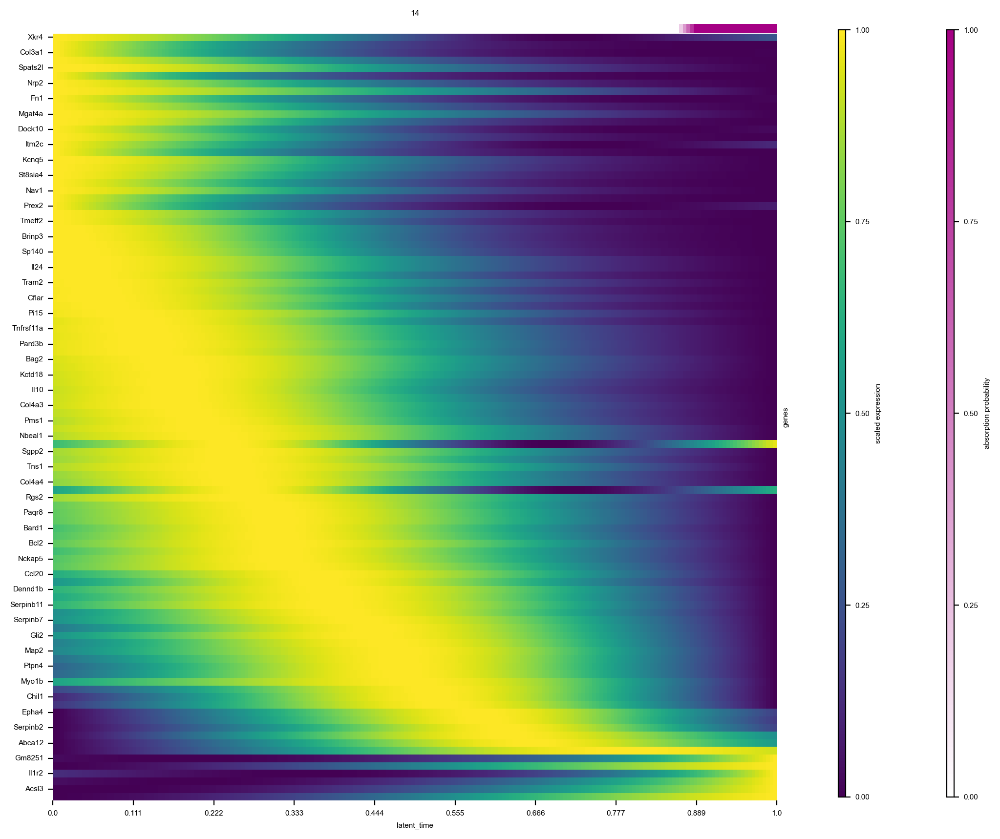

In [18]:
cr.pl.heatmap(adata,
              model,
              adata.var_names[:100],
              time_key = 'latent_time',
              lineages = '14',
              show_progress_bar = False,
              show_absorption_probabilities = True,
              figsize = (10, 10),
              save ='keratinocyte_uninfected/latent_time.pdf',
              return_genes = True)

In [19]:
genes = adata.varm['terminal_lineage_drivers']["14_corr"].sort_values(ascending=False).index[:50]
scv.tl.differential_kinetic_test(adata, var_names=genes, groupby='seurat_clusters')

scv.get_df(adata[:, genes], ['fit_diff_kinetics', 'fit_pval_kinetics'], precision=2)

kwargs = dict(linewidth=2, add_linfit=True, frameon='artist')

recovering dynamics (using 1/12 cores)


  0%|          | 0/33 [00:00<?, ?gene/s]

/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/scvelo/tools/dynamical_model.py:721: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array([dm.alpha, dm.beta, dm.gamma, dm.pars[:3]]) / dm.m[-1]
/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/scvelo/tools/dynamical_model.py:724: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array([dm.t, dm.tau, dm.t_, dm.pars[4]]) * dm.m[-1]


    finished (0:00:12)
testing for differential kinetics
    finished (0:00:11)


/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/scvelo/core/_anndata.py:306: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  df.var_names = df.index


In [20]:
diff_clusters=list(adata[:, genes].var['fit_diff_kinetics'])

# top-likelihood genes
scv.tl.recover_dynamics(adata, n_jobs=10)
top_genes = adata.var['fit_likelihood'].sort_values(ascending=False).index[:100]
scv.tl.differential_kinetic_test(adata, var_names=top_genes, groupby='seurat_clusters')

recovering dynamics (using 10/12 cores)


  0%|          | 0/407 [00:00<?, ?gene/s]

did not converge
did not converge
did not converge


/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/scvelo/tools/dynamical_model.py:721: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array([dm.alpha, dm.beta, dm.gamma, dm.pars[:3]]) / dm.m[-1]
/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/scvelo/tools/dynamical_model.py:724: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array([dm.t, dm.tau, dm.t_, dm.pars[4]]) * dm.m[-1]


    finished (0:00:37)
testing for differential kinetics
    finished (0:00:22)


saving figure to file ./figures/keratinocyte_uninfected/top_likelihood.pdf


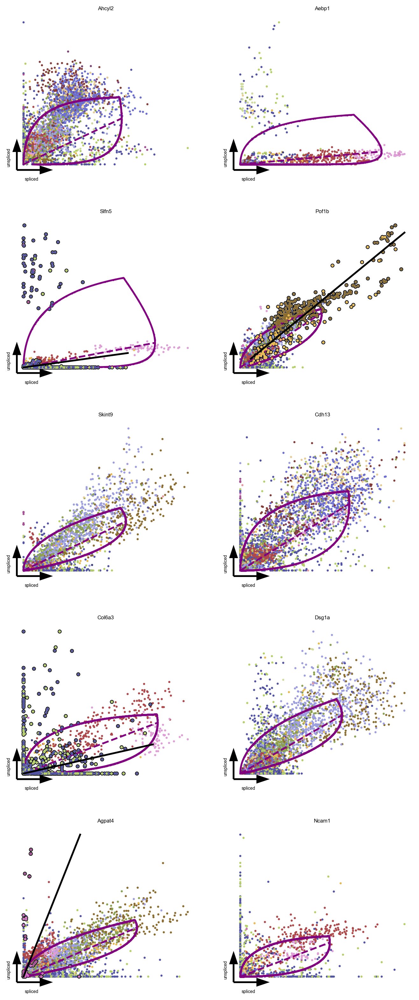

saving figure to file ./figures/keratinocyte_uninfected/top_likelihood_latent.pdf


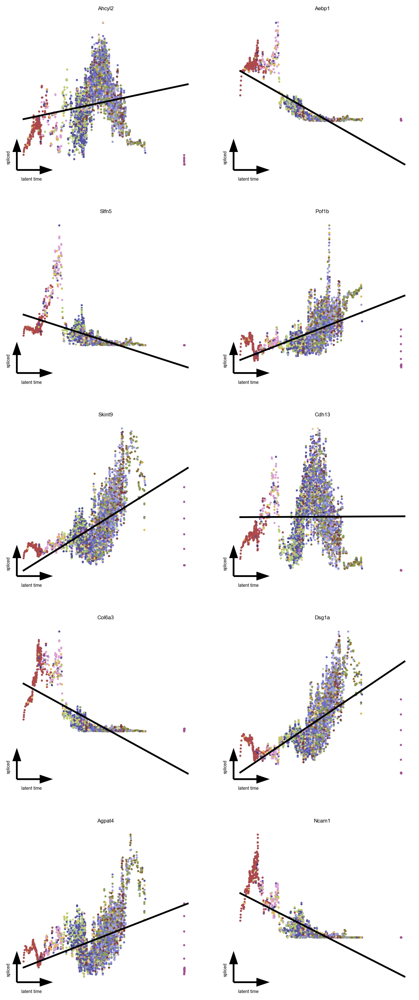

In [21]:
scv.pl.scatter(adata, basis=top_genes[:10], ncols=2, add_outline='fit_diff_kinetics', **kwargs, save='top_likelihood', smooth=True)
scv.pl.scatter(adata, x='latent_time', y=top_genes[:10], save='top_likelihood_latent', color='seurat_clusters', **kwargs, ncols=2, n_convolve=10, smooth=True)

In [22]:
scv.settings.plot_prefix = 'endothelial_uninfected/'

In [23]:
X = io.mmread("data/uninfected_endothelial_counts.mtx")

In [24]:
adata = ad.AnnData(
    X=X.transpose().tocsr(), dtype=X.dtype
)

# load cell metadata pre-calculated in Seurat:
cell_meta = pd.read_csv("data/uninfected_endothelial_metadata.csv")

# load gene names pre-calculated in Seurat:
with open("data/uninfected_endothelial_gene_names.csv", 'r') as f:
    gene_names = f.read().splitlines()

# load barcodes pre-calculated in Seurat:
adata.obs = cell_meta
adata.obs.index = adata.obs['barcode']
adata.var.index = gene_names

# load dimensional reduction pre-calculated in Seurat:
pca = pd.read_csv("data/uninfected_endothelial_pca.csv")
pca.index = adata.obs.index

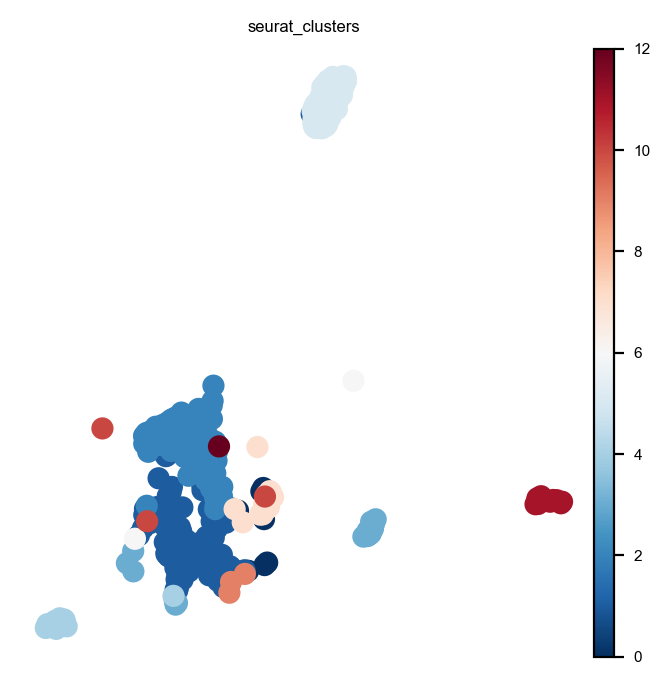

In [25]:
# set pca and umap pre-calculated in Seurat:
adata.obsm['X_pca'] = pca.to_numpy()
adata.obsm['X_umap'] = np.vstack((adata.obs['UMAP_1'].to_numpy(), adata.obs['UMAP_2'].to_numpy())).T

# plot a UMAP colored by celltypes to test:
sc.pl.umap(adata,
           color='seurat_clusters', palette=palette,
           frameon=False)

In [26]:
# read .loom files created in velocyto for each sample in the integrated dataset
ldata1 = scv.read('loom/uninfected_1.loom', cache=False, validate=False)
ldata2 = scv.read('loom/uninfected_2.loom', cache=False, validate=False)

/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [27]:
# rename barcodes in order to merge
barcodes = [bc.split(':')[1] for bc in ldata1.obs.index.tolist()]
barcodes = [bc[0:len(bc)-1] + '_1' for bc in barcodes]
ldata1.obs.index = barcodes

barcodes = [bc.split(':')[1] for bc in ldata2.obs.index.tolist()]
barcodes = [bc[0:len(bc)-1] + '_2' for bc in barcodes]
ldata2.obs.index = barcodes

ldata1.var_names_make_unique()
ldata2.var_names_make_unique()

# concatenate loom data
ldata = ldata1.concatenate(ldata2)

scv.utils.clean_obs_names(adata)
scv.utils.clean_obs_names(ldata)

# merge matrices into the original adata object
adata = scv.utils.merge(adata, ldata)

# save dataset as anndata format
adata.write('adata/uninfected_endothelial.h5ad')

In [28]:
#adata = scv.read('adata/uninfected_endothelial.h5ad')

scv.pp.filter_and_normalize(adata, min_shared_counts=20, n_top_genes=2000)
sc.tl.pca(adata)
sc.pp.neighbors(adata, n_pcs=15, n_neighbors=30)
scv.pp.moments(adata, n_pcs=None, n_neighbors=None)

scv.tl.recover_dynamics(adata, n_jobs = 10)

scv.tl.velocity(adata, mode = 'dynamical', n_jobs = 10)
scv.tl.velocity_graph(adata, n_jobs = 10)

# save for later
adata.write('processed_adata/uninfected_endothelial.h5ad', compression='gzip')
#adata = scv.read('processed_adata/uninfected_endothelial.h5ad')

Filtered out 20079 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 2000 highly variable genes.
computing moments based on connectivities
    finished (0:00:00)
recovering dynamics (using 10/12 cores)


  0%|          | 0/809 [00:00<?, ?gene/s]

/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/scvelo/tools/dynamical_model.py:721: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array([dm.alpha, dm.beta, dm.gamma, dm.pars[:3]]) / dm.m[-1]
/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/scvelo/tools/dynamical_model.py:724: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array([dm.t, dm.tau, dm.t_, dm.pars[4]]) * dm.m[-1]


    finished (0:00:14)
computing velocities
    finished (0:00:00)
computing velocity graph (using 10/12 cores)


  0%|          | 0/469 [00:00<?, ?cells/s]

/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/scvelo/core/_parallelize.py:138: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = np.array(res) if as_array else res


    finished (0:00:01)


computing velocity embedding
    finished (0:00:00)
saving figure to file ./figures/endothelial_uninfected/velocity_stream.svg


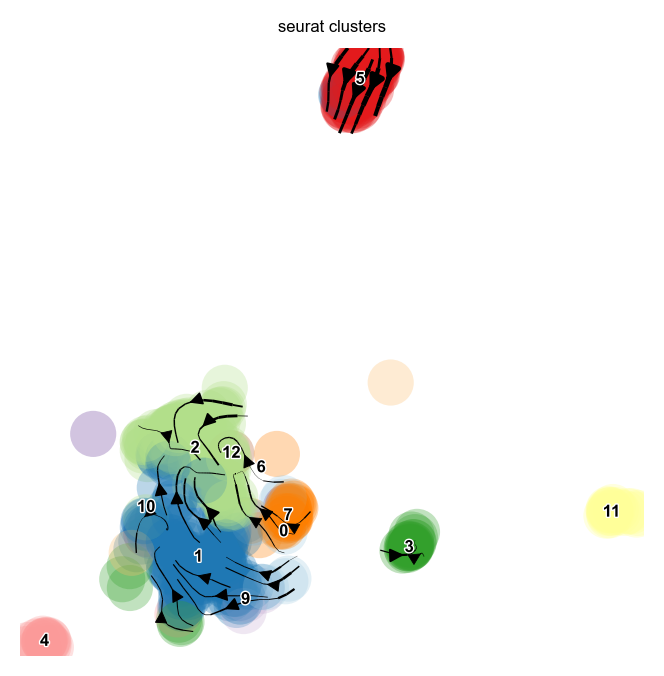

In [29]:
scv.pl.velocity_embedding_stream(adata,
                                 basis = 'umap',
                                 smooth = 0.8,
                                 min_mass = 4,
                                 palette = palette,
                                 color = 'seurat_clusters',
                                 save = 'velocity_stream.svg'
                                )

Accessing `adata.obsp['T_fwd']`
Computing transition matrix based on logits using `'deterministic'` mode
Estimating `softmax_scale` using `'deterministic'` mode


/var/folders/9b/399_qf9s3gz9j3f1l6bkpm0m0000gp/T/ipykernel_79101/2542135366.py:1: DeprecationWarning: `cellrank.tl.terminal_states` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  cr.tl.terminal_states(adata,
/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/cellrank/tl/_init_term_states.py:156: DeprecationWarning: `cellrank.tl.transition_matrix` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  kernel = transition_matrix(


  0%|          | 0/469 [00:00<?, ?cell/s]

Setting `softmax_scale=1.2817`


  0%|          | 0/469 [00:00<?, ?cell/s]

    Finish (0:00:00)
Using a connectivity kernel with weight `0.2`
Computing transition matrix based on `adata.obsp['connectivities']`
    Finish (0:00:00)
Computing eigendecomposition of the transition matrix
Adding `adata.uns['eigendecomposition_fwd']`
       `.eigendecomposition`
    Finish (0:00:00)
For 1 macrostate, stationary distribution is computed
Adding `.macrostates`
       `.macrostates_memberships`
       `.coarse_T`
       `.coarse_initial_distribution
       `.coarse_stationary_distribution`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:00)
Adding `adata.obs['terminal_states']`
       `adata.obs['terminal_states_probs']`
       `.terminal_states`
       `.terminal_states_probabilities`
       `.terminal_states_memberships
    Finish`
Accessing `adata.obsp['T_bwd']`
Computing transition matrix based on logits using `'deterministic'` mode
Estimating `softmax_scale` using `'deterministic'` mode


/var/folders/9b/399_qf9s3gz9j3f1l6bkpm0m0000gp/T/ipykernel_79101/2542135366.py:5: DeprecationWarning: `cellrank.tl.initial_states` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  cr.tl.initial_states(adata, cluster_key = 'seurat_clusters')
/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/cellrank/tl/_init_term_states.py:156: DeprecationWarning: `cellrank.tl.transition_matrix` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  kernel = transition_matrix(


  0%|          | 0/469 [00:00<?, ?cell/s]

Setting `softmax_scale=1.2817`


  0%|          | 0/469 [00:00<?, ?cell/s]

    Finish (0:00:00)
Using a connectivity kernel with weight `0.2`
Computing transition matrix based on `adata.obsp['connectivities']`
    Finish (0:00:00)
Computing eigendecomposition of the transition matrix
Adding `adata.uns['eigendecomposition_bwd']`
       `.eigendecomposition`
    Finish (0:00:00)
For 1 macrostate, stationary distribution is computed
Adding `.macrostates`
       `.macrostates_memberships`
       `.coarse_T`
       `.coarse_initial_distribution
       `.coarse_stationary_distribution`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:00)
Adding `adata.obs['initial_states']`
       `adata.obs['initial_states_probs']`
       `.terminal_states`
       `.terminal_states_probabilities`
       `.terminal_states_memberships
    Finish`
Computing absorption probabilities


/var/folders/9b/399_qf9s3gz9j3f1l6bkpm0m0000gp/T/ipykernel_79101/2542135366.py:7: DeprecationWarning: `cellrank.tl.lineages` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  cr.tl.lineages(adata)


  0%|          | 0/1 [00:00<?, ?/s]

Adding `adata.obsm['to_terminal_states']`
       `.absorption_probabilities`
    Finish (0:00:00)
computing latent time using initial_states_probs, terminal_states_probs as prior
    finished (0:00:00)
running PAGA using priors: ['velocity_pseudotime', 'initial_states_probs', 'terminal_states_probs']
    finished (0:00:00)


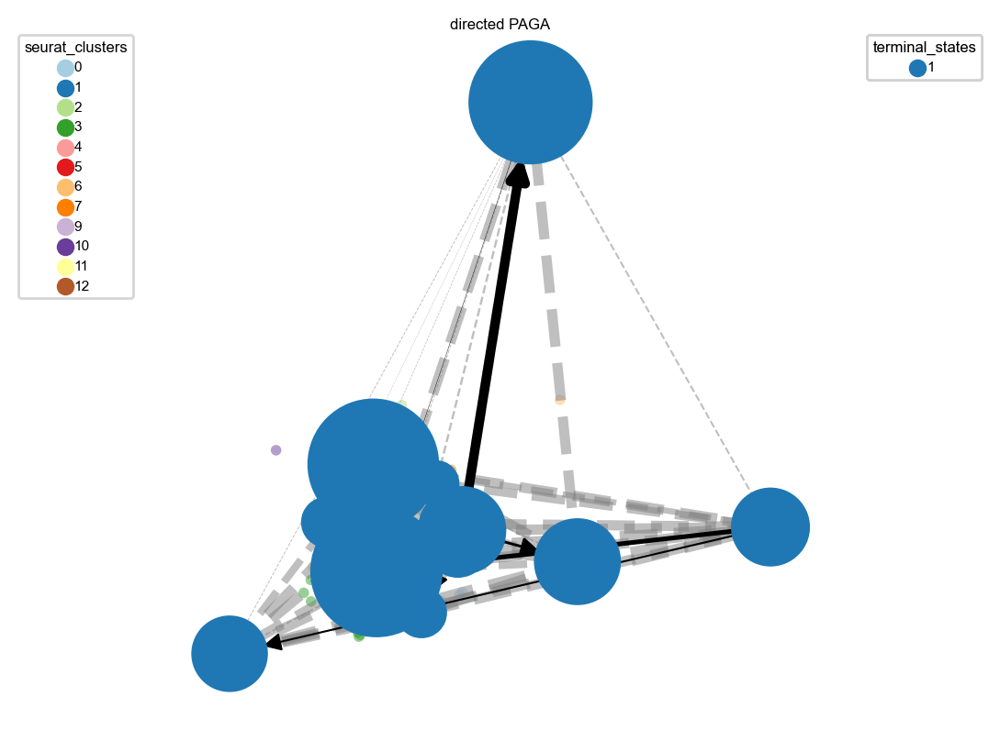

In [30]:
cr.tl.terminal_states(adata,
                      cluster_key="seurat_clusters",
                      weight_connectivities=0.2)

cr.tl.initial_states(adata, cluster_key = 'seurat_clusters')

cr.tl.lineages(adata)

# Directed PAGA
scv.tl.recover_latent_time(adata,
                           root_key="initial_states_probs",
                           end_key="terminal_states_probs")

scv.tl.paga(adata,
            groups="seurat_clusters",
            root_key="initial_states_probs",
            end_key="terminal_states_probs",
            use_time_prior="velocity_pseudotime")

cr.pl.cluster_fates(adata,
                    mode="paga_pie",
                    cluster_key="seurat_clusters",
                    basis="umap",
                    legend_kwargs={"loc": "top right out"},
                    legend_loc="top left out",
                    node_size_scale=5,
                    edge_width_scale=1,
                    max_edge_width=4,
                    title="directed PAGA",
                    save = 'endothelial_uninfected/cluster_fates.pdf'
                   )

Adding `adata.varm['terminal_lineage_drivers']`
       `.lineage_drivers`
    Finish (0:00:00)


/var/folders/9b/399_qf9s3gz9j3f1l6bkpm0m0000gp/T/ipykernel_79101/3451711689.py:1: DeprecationWarning: `cellrank.tl.lineage_drivers` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  cr.tl.lineage_drivers(adata)
/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/scvelo/plotting/utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()
/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/scvelo/plotting/utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()
/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/scvelo/plotting/utils.py:869: MatplotlibDeprecationWarning: The draw_all function was dep

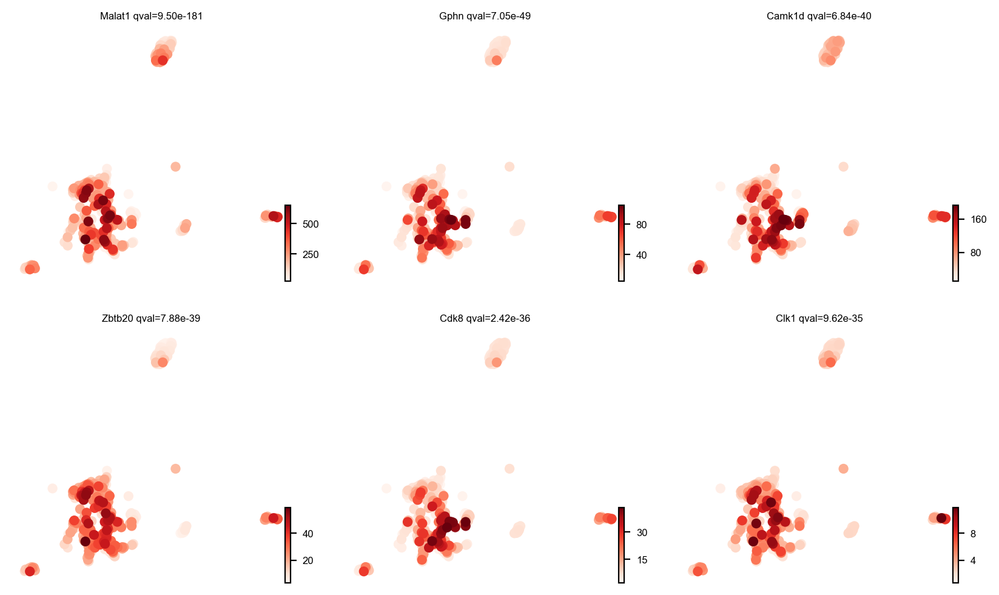

In [31]:
cr.tl.lineage_drivers(adata)

cr.pl.lineage_drivers(adata,
                      lineage='1',
                      n_genes=6,
                      ncols=3,
                      title_fmt='{gene} qval={qval:.2e}',
                      save='endothelial_uninfected/lineage_drivers_rescaled.pdf',
                      color_map='Reds',
                      figsize=(10, 6),
                      smooth=True,
                      wspace=5
                      )

/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/scvelo/plotting/scatter.py:614: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(
/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/scvelo/plotting/scatter.py:614: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(
/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/scvelo/plotting/utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()
/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/scvelo/plotting/utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()


saving figure to file ./figures/endothelial_uninfected/root_latent_dpt.pdf


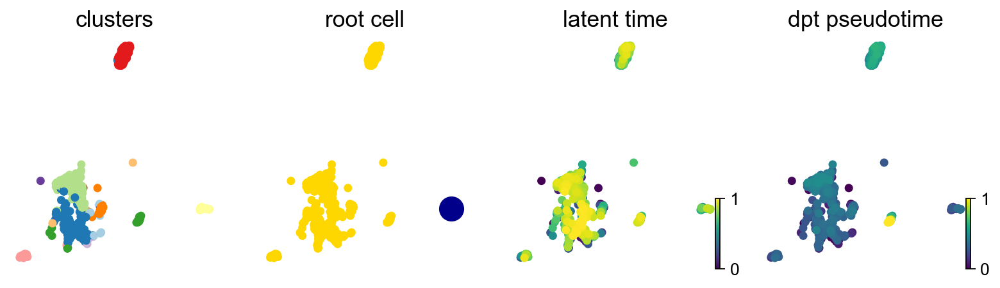

In [32]:
## compute DPT, starting from CellRank defined root cell
root_idx = np.where(adata.obs["initial_states"] == "7")[0][0]
adata.uns["iroot"] = root_idx
sc.tl.diffmap(adata)
sc.tl.dpt(adata)

scv.pl.scatter(adata,
               color = ["seurat_clusters", root_idx, "latent_time", "dpt_pseudotime"],
               fontsize = 16,
               cmap = "viridis",
               perc = [2, 98],
               colorbar = True,
               rescale_color = [0, 1],
               title = ["clusters", "root cell", "latent time", "dpt pseudotime"],
               save = 'root_latent_dpt.pdf'
              )

Computing trends using `10` core(s)


  0%|          | 0/6 [00:00<?, ?gene/s]

    Finish (0:00:06)
Plotting trends


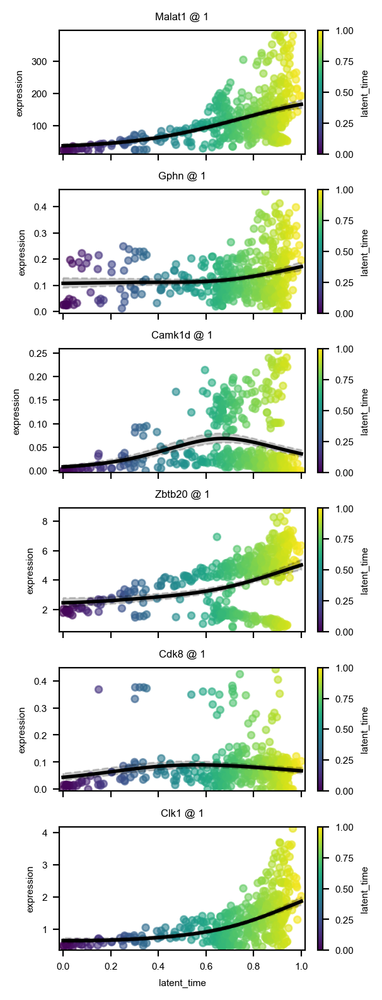

In [33]:
model = cr.ul.models.GAM(adata)

genes = adata.varm['terminal_lineage_drivers']["1_corr"].sort_values(ascending=False).index[:6]

cr.pl.gene_trends(adata,
                  model = model,
                  data_key = "Ms",
                  genes = genes,
                  lineages = '1',
                  time_key = "latent_time",
                  same_plot = False,
                  hide_cells = False,
                  show_progress_bar = False,
                  figsize = (3, 8),
                  gene_as_title = True,
                  cell_color = 'latent_time',
                  n_jobs = 10,
                  save = 'endothelial_uninfected/gene_trends.pdf'
                 )

Computing trends using `1` core(s)


  0%|          | 0/50 [00:00<?, ?gene/s]

/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/pygam/utils.py:649: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  bases = (x >= aug_knots[:-1]).astype(np.int) * \
/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/pygam/utils.py:650: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish

    Finish (0:00:01)


/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/pygam/utils.py:649: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  bases = (x >= aug_knots[:-1]).astype(np.int) * \
/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/pygam/utils.py:650: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish

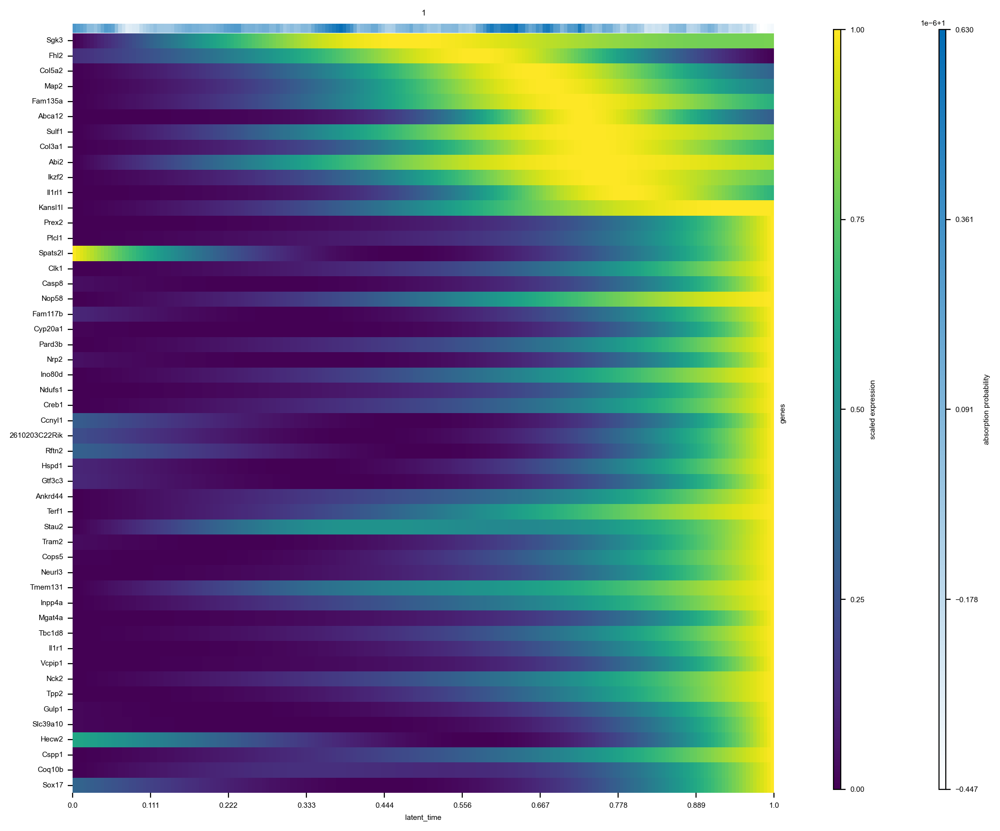

In [34]:
cr.pl.heatmap(adata,
              model,
              adata.var_names[:50],
              time_key = 'latent_time',
              lineages = '1',
              show_progress_bar = False,
              show_absorption_probabilities = True,
              figsize = (10, 10),
              save ='endothelial_uninfected/latent_time.pdf',
              return_genes = False)

In [35]:
genes = adata.varm['terminal_lineage_drivers']["1_corr"].sort_values(ascending=False).index[:50]
scv.tl.differential_kinetic_test(adata, var_names=genes, groupby='seurat_clusters')

kwargs = dict(linewidth=2, add_linfit=True, frameon='artist')

diff_clusters=list(adata[:, genes].var['fit_diff_kinetics'])

scv.tl.recover_dynamics(adata, n_jobs=10)
top_genes = adata.var['fit_likelihood'].sort_values(ascending=False).index[:100]
scv.tl.differential_kinetic_test(adata, var_names=top_genes, groupby='seurat_clusters')

recovering dynamics (using 1/12 cores)


  0%|          | 0/29 [00:00<?, ?gene/s]

/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/scvelo/tools/dynamical_model.py:721: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array([dm.alpha, dm.beta, dm.gamma, dm.pars[:3]]) / dm.m[-1]
/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/scvelo/tools/dynamical_model.py:724: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array([dm.t, dm.tau, dm.t_, dm.pars[4]]) * dm.m[-1]


    finished (0:00:02)
testing for differential kinetics
    finished (0:00:03)
recovering dynamics (using 10/12 cores)


  0%|          | 0/709 [00:00<?, ?gene/s]

/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/scvelo/tools/dynamical_model.py:721: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array([dm.alpha, dm.beta, dm.gamma, dm.pars[:3]]) / dm.m[-1]
/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/scvelo/tools/dynamical_model.py:724: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array([dm.t, dm.tau, dm.t_, dm.pars[4]]) * dm.m[-1]


    finished (0:00:17)
testing for differential kinetics
    finished (0:00:06)


saving figure to file ./figures/endothelial_uninfected/top_likelihood.pdf


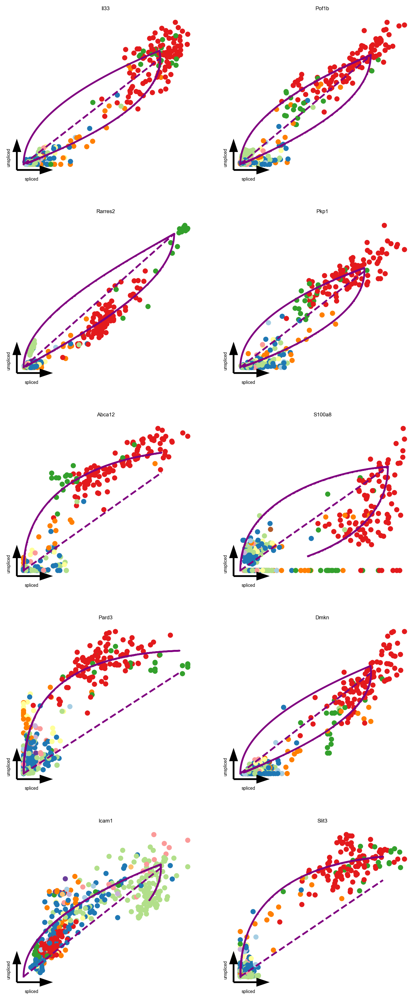

saving figure to file ./figures/endothelial_uninfected/top_likelihood_latent.pdf


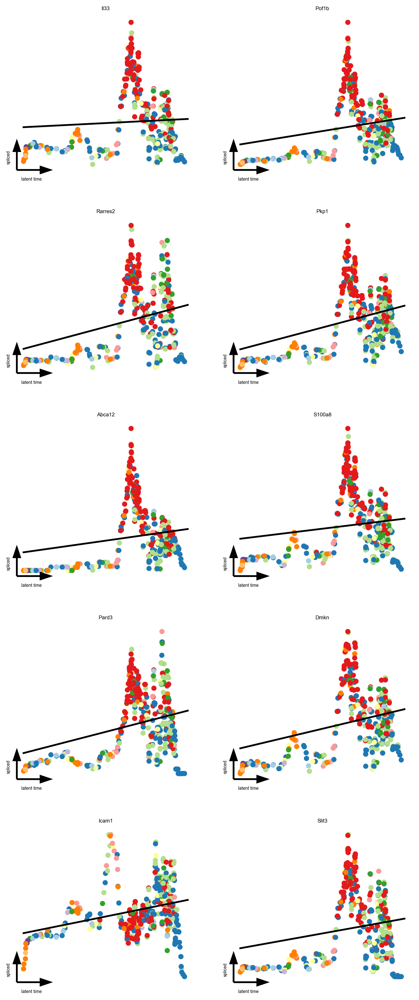

In [36]:
scv.pl.scatter(adata, basis=top_genes[:10], ncols=2, add_outline='fit_diff_kinetics', **kwargs, save='top_likelihood', smooth=True)
scv.pl.scatter(adata, x='latent_time', y=top_genes[:10], save='top_likelihood_latent', color='seurat_clusters', **kwargs, ncols=2, n_convolve=10, smooth=True)

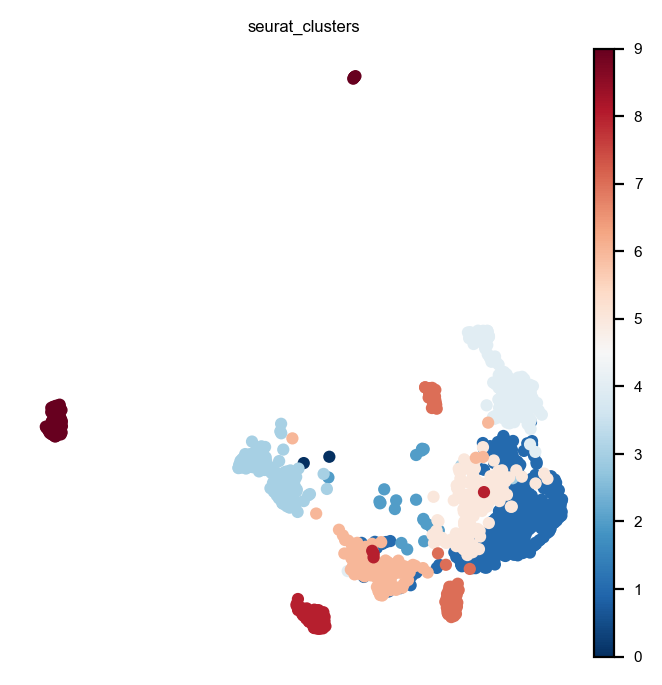

/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Filtered out 16941 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 2000 highly variable genes.
computing moments based on connectivities
    finished (0:00:00)
recovering dynamics (using 10/12 cores)


  0%|          | 0/470 [00:00<?, ?gene/s]

/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/scvelo/tools/dynamical_model.py:721: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array([dm.alpha, dm.beta, dm.gamma, dm.pars[:3]]) / dm.m[-1]
/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/scvelo/tools/dynamical_model.py:724: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array([dm.t, dm.tau, dm.t_, dm.pars[4]]) * dm.m[-1]


    finished (0:00:15)
computing velocities
    finished (0:00:00)
computing velocity graph (using 10/12 cores)


  0%|          | 0/1545 [00:00<?, ?cells/s]

/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/scvelo/core/_parallelize.py:138: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = np.array(res) if as_array else res


    finished (0:00:02)
computing velocity embedding
    finished (0:00:00)
saving figure to file ./figures/fibroblast_uninfected/velocity_stream.svg


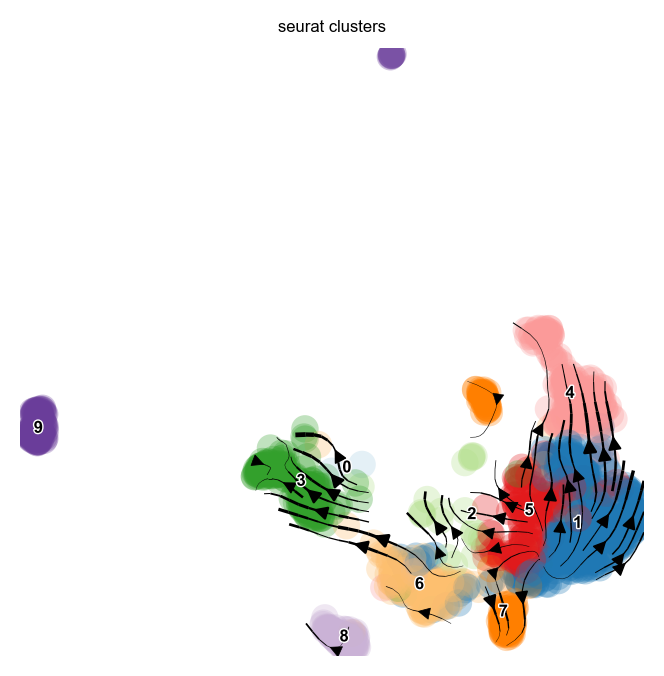

Accessing `adata.obsp['T_fwd']`
Computing transition matrix based on logits using `'deterministic'` mode
Estimating `softmax_scale` using `'deterministic'` mode


/var/folders/9b/399_qf9s3gz9j3f1l6bkpm0m0000gp/T/ipykernel_79101/2138773070.py:87: DeprecationWarning: `cellrank.tl.terminal_states` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  cr.tl.terminal_states(adata,
/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/cellrank/tl/_init_term_states.py:156: DeprecationWarning: `cellrank.tl.transition_matrix` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  kernel = transition_matrix(


  0%|          | 0/1545 [00:00<?, ?cell/s]

Setting `softmax_scale=4.8273`


  0%|          | 0/1545 [00:00<?, ?cell/s]

    Finish (0:00:01)
Using a connectivity kernel with weight `0.2`
Computing transition matrix based on `adata.obsp['connectivities']`
    Finish (0:00:00)
Computing eigendecomposition of the transition matrix
Adding `adata.uns['eigendecomposition_fwd']`
       `.eigendecomposition`
    Finish (0:00:00)
For 1 macrostate, stationary distribution is computed
Adding `.macrostates`
       `.macrostates_memberships`
       `.coarse_T`
       `.coarse_initial_distribution
       `.coarse_stationary_distribution`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:00)
Adding `adata.obs['terminal_states']`
       `adata.obs['terminal_states_probs']`
       `.terminal_states`
       `.terminal_states_probabilities`
       `.terminal_states_memberships
    Finish`
Accessing `adata.obsp['T_bwd']`
Computing transition matrix based on logits using `'deterministic'` mode
Estimating `softmax_scale` using `'deterministic'` mode


/var/folders/9b/399_qf9s3gz9j3f1l6bkpm0m0000gp/T/ipykernel_79101/2138773070.py:91: DeprecationWarning: `cellrank.tl.initial_states` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  cr.tl.initial_states(adata, cluster_key = 'seurat_clusters')
/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/cellrank/tl/_init_term_states.py:156: DeprecationWarning: `cellrank.tl.transition_matrix` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  kernel = transition_matrix(


  0%|          | 0/1545 [00:00<?, ?cell/s]

Setting `softmax_scale=4.8273`


  0%|          | 0/1545 [00:00<?, ?cell/s]

    Finish (0:00:01)
Using a connectivity kernel with weight `0.2`
Computing transition matrix based on `adata.obsp['connectivities']`
    Finish (0:00:00)
Computing eigendecomposition of the transition matrix
Adding `adata.uns['eigendecomposition_bwd']`
       `.eigendecomposition`
    Finish (0:00:00)
For 1 macrostate, stationary distribution is computed
Adding `.macrostates`
       `.macrostates_memberships`
       `.coarse_T`
       `.coarse_initial_distribution
       `.coarse_stationary_distribution`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:00)
Adding `adata.obs['initial_states']`
       `adata.obs['initial_states_probs']`
       `.terminal_states`
       `.terminal_states_probabilities`
       `.terminal_states_memberships
    Finish`
Computing absorption probabilities


/var/folders/9b/399_qf9s3gz9j3f1l6bkpm0m0000gp/T/ipykernel_79101/2138773070.py:93: DeprecationWarning: `cellrank.tl.lineages` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  cr.tl.lineages(adata)


  0%|          | 0/1 [00:00<?, ?/s]

Adding `adata.obsm['to_terminal_states']`
       `.absorption_probabilities`
    Finish (0:00:00)
computing latent time using initial_states_probs, terminal_states_probs as prior
    finished (0:00:00)
running PAGA using priors: ['velocity_pseudotime', 'initial_states_probs', 'terminal_states_probs']
    finished (0:00:00)
Adding `adata.varm['terminal_lineage_drivers']`
       `.lineage_drivers`
    Finish (0:00:00)


/var/folders/9b/399_qf9s3gz9j3f1l6bkpm0m0000gp/T/ipykernel_79101/2138773070.py:119: DeprecationWarning: `cellrank.tl.lineage_drivers` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  cr.tl.lineage_drivers(adata)


,3_corr,3_pval,3_qval,3_ci_low,3_ci_high
Eln,0.41,2.30e-65,4.60e-62,0.37,4.50e-01
Cilp,0.27,2.79e-27,2.79e-24,0.22,3.14e-01
Mgp,0.24,1.70e-22,1.13e-19,0.20,2.90e-01
Krt6b,0.19,1.01e-14,5.03e-12,0.15,2.42e-01
Sfrp4,0.19,1.79e-14,7.17e-12,0.14,2.40e-01
...,...,...,...,...,...
Serpina3n,-0.03,2.25e-01,7.29e-01,-0.08,1.90e-02
Rarres2,-0.03,1.76e-01,6.59e-01,-0.08,1.55e-02
Kiz,-0.04,1.51e-01,6.26e-01,-0.09,1.34e-02
Nos2,-0.04,1.15e-01,5.61e-01,-0.09,9.82e-03


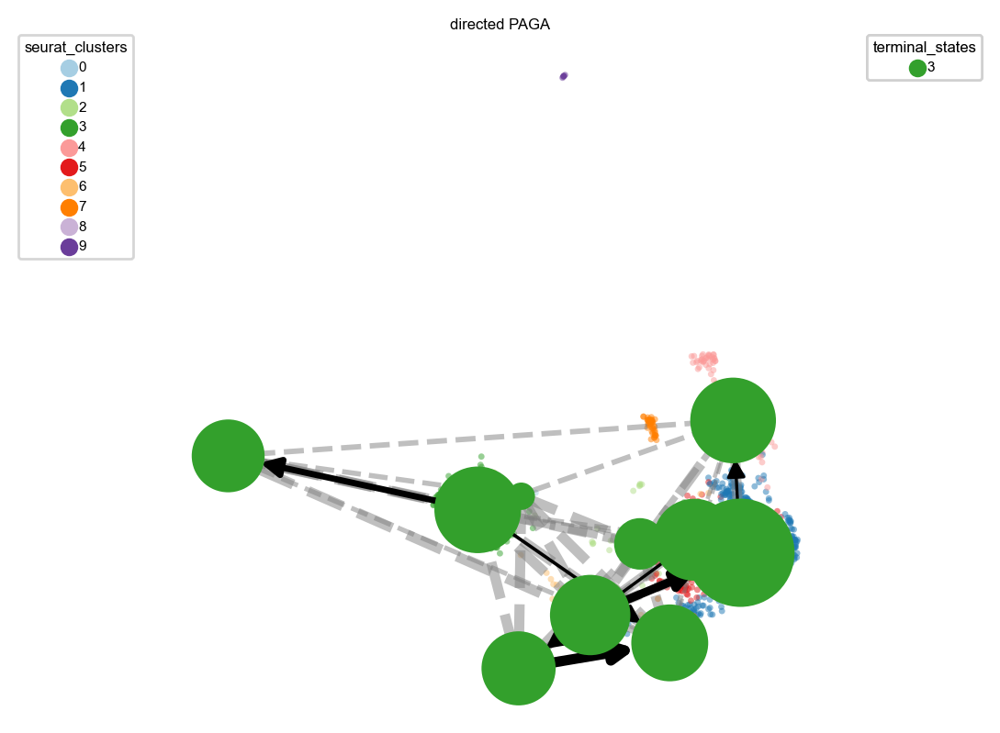

In [37]:
scv.settings.plot_prefix = 'fibroblast_uninfected/'

X = io.mmread("data/uninfected_fibroblast_counts.mtx")

adata = ad.AnnData(
    X=X.transpose().tocsr(), dtype=X.dtype
)

# load cell metadata pre-calculated in Seurat:
cell_meta = pd.read_csv("data/uninfected_fibroblast_metadata.csv")

# load gene names pre-calculated in Seurat:
with open("data/uninfected_fibroblast_gene_names.csv", 'r') as f:
    gene_names = f.read().splitlines()

# load barcodes pre-calculated in Seurat:
adata.obs = cell_meta
adata.obs.index = adata.obs['barcode']
adata.var.index = gene_names

# load dimensional reduction pre-calculated in Seurat:
pca = pd.read_csv("data/uninfected_fibroblast_pca.csv")
pca.index = adata.obs.index

# set pca and umap pre-calculated in Seurat:
adata.obsm['X_pca'] = pca.to_numpy()
adata.obsm['X_umap'] = np.vstack((adata.obs['UMAP_1'].to_numpy(), adata.obs['UMAP_2'].to_numpy())).T

# plot a UMAP colored by celltypes to test:
sc.pl.umap(adata,
           color='seurat_clusters', palette=palette,
           frameon=False)

# read .loom files created in velocyto for each sample in the integrated dataset
ldata1 = scv.read('loom/uninfected_1.loom', cache=False, validate=False)
ldata2 = scv.read('loom/uninfected_2.loom', cache=False, validate=False)

# rename barcodes in order to merge
barcodes = [bc.split(':')[1] for bc in ldata1.obs.index.tolist()]
barcodes = [bc[0:len(bc)-1] + '_1' for bc in barcodes]
ldata1.obs.index = barcodes

barcodes = [bc.split(':')[1] for bc in ldata2.obs.index.tolist()]
barcodes = [bc[0:len(bc)-1] + '_2' for bc in barcodes]
ldata2.obs.index = barcodes

ldata1.var_names_make_unique()
ldata2.var_names_make_unique()

# concatenate loom data
ldata = ldata1.concatenate(ldata2)

scv.utils.clean_obs_names(adata)
scv.utils.clean_obs_names(ldata)

# merge matrices into the original adata object
adata = scv.utils.merge(adata, ldata)

# save dataset as anndata format
adata.write('adata/uninfected_fibroblast.h5ad')

#adata = scv.read('adata/uninfected_fibroblast.h5ad')

scv.pp.filter_and_normalize(adata, min_shared_counts=20, n_top_genes=2000)
sc.tl.pca(adata)
sc.pp.neighbors(adata, n_pcs=15, n_neighbors=30)
scv.pp.moments(adata, n_pcs=None, n_neighbors=None)

scv.tl.recover_dynamics(adata, n_jobs = 10)

scv.tl.velocity(adata, mode = 'dynamical', n_jobs = 10)
scv.tl.velocity_graph(adata, n_jobs = 10)

# save for later
adata.write('processed_adata/uninfected_fibroblast.h5ad', compression='gzip')
#adata = scv.read('processed_adata/uninfected_fibroblast.h5ad')

scv.pl.velocity_embedding_stream(adata,
                                 basis = 'umap',
                                 smooth = 0.8,
                                 min_mass = 4,
                                 palette = palette,
                                 color = 'seurat_clusters',
                                 save = 'velocity_stream.svg'
                                )

cr.tl.terminal_states(adata,
                      cluster_key="seurat_clusters",
                      weight_connectivities=0.2)

cr.tl.initial_states(adata, cluster_key = 'seurat_clusters')

cr.tl.lineages(adata)

# Directed PAGA
scv.tl.recover_latent_time(adata,
                           root_key="initial_states_probs",
                           end_key="terminal_states_probs")

scv.tl.paga(adata,
            groups="seurat_clusters",
            root_key="initial_states_probs",
            end_key="terminal_states_probs",
            use_time_prior="velocity_pseudotime")

cr.pl.cluster_fates(adata,
                    mode="paga_pie",
                    cluster_key="seurat_clusters",
                    basis="umap",
                    legend_kwargs={"loc": "top right out"},
                    legend_loc="top left out",
                    node_size_scale=5,
                    edge_width_scale=1,
                    max_edge_width=4,
                    title="directed PAGA",
                    save = 'fibroblast_uninfected/cluster_fates.pdf'
                   )

cr.tl.lineage_drivers(adata)


/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/scvelo/plotting/utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()
/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/scvelo/plotting/utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()
/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/scvelo/plotting/utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()
/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/scvelo/plotting/utils.py:869: MatplotlibDeprecationWarning: The draw_all functi

saving figure to file ./figures/fibroblast_uninfected/root_latent_dpt.pdf


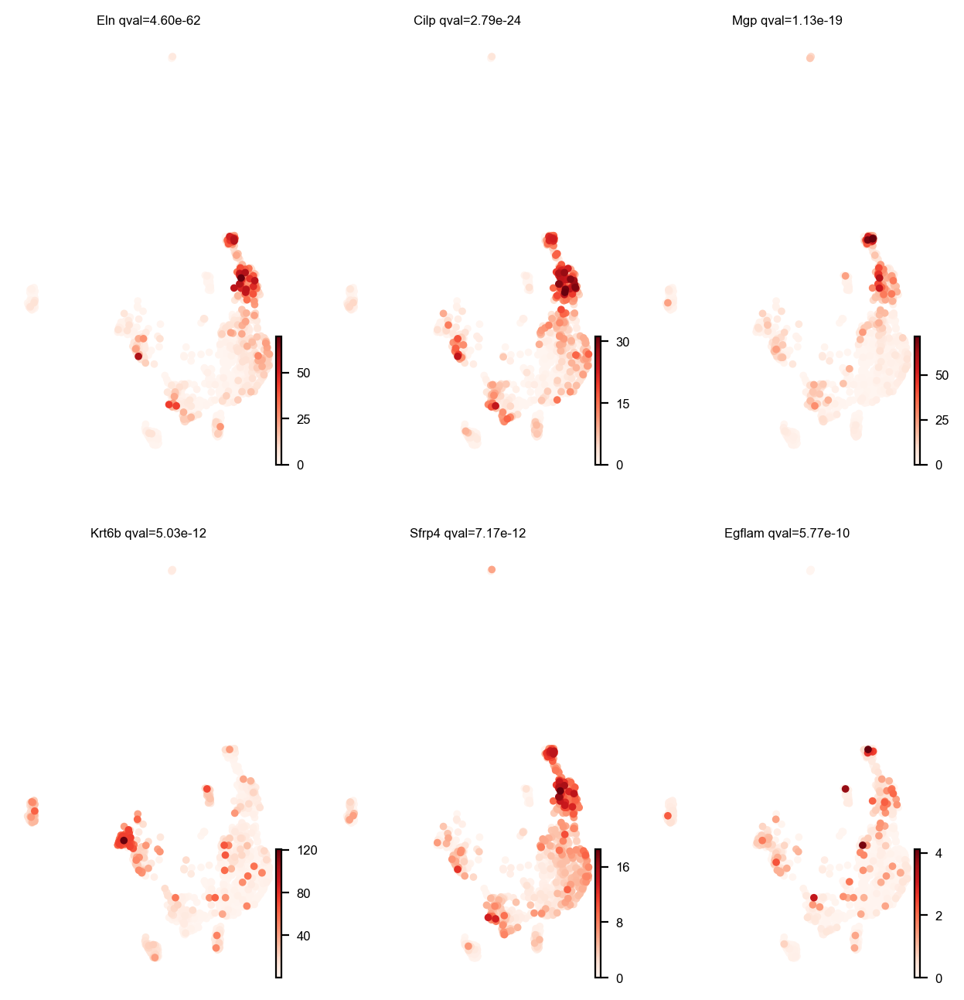

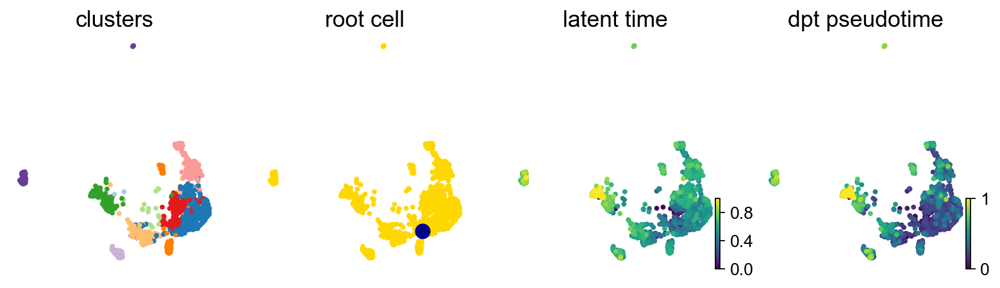

Computing trends using `10` core(s)


  0%|          | 0/6 [00:00<?, ?gene/s]

    Finish (0:00:09)
Plotting trends
Computing trends using `1` core(s)


  0%|          | 0/50 [00:00<?, ?gene/s]

/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/pygam/utils.py:649: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  bases = (x >= aug_knots[:-1]).astype(np.int) * \
/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/pygam/utils.py:650: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish

    Finish (0:00:02)


/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/pygam/utils.py:649: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  bases = (x >= aug_knots[:-1]).astype(np.int) * \
/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/pygam/utils.py:650: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish

recovering dynamics (using 1/12 cores)


  0%|          | 0/18 [00:00<?, ?gene/s]

/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/scvelo/tools/dynamical_model.py:721: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array([dm.alpha, dm.beta, dm.gamma, dm.pars[:3]]) / dm.m[-1]
/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/scvelo/tools/dynamical_model.py:724: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array([dm.t, dm.tau, dm.t_, dm.pars[4]]) * dm.m[-1]


    finished (0:00:02)
testing for differential kinetics
    finished (0:00:04)
recovering dynamics (using 10/12 cores)


  0%|          | 0/386 [00:00<?, ?gene/s]

/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/scvelo/tools/dynamical_model.py:721: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array([dm.alpha, dm.beta, dm.gamma, dm.pars[:3]]) / dm.m[-1]
/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/scvelo/tools/dynamical_model.py:724: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array([dm.t, dm.tau, dm.t_, dm.pars[4]]) * dm.m[-1]


    finished (0:00:17)
testing for differential kinetics
    finished (0:00:09)
saving figure to file ./figures/fibroblast_uninfected/top_likelihood.pdf


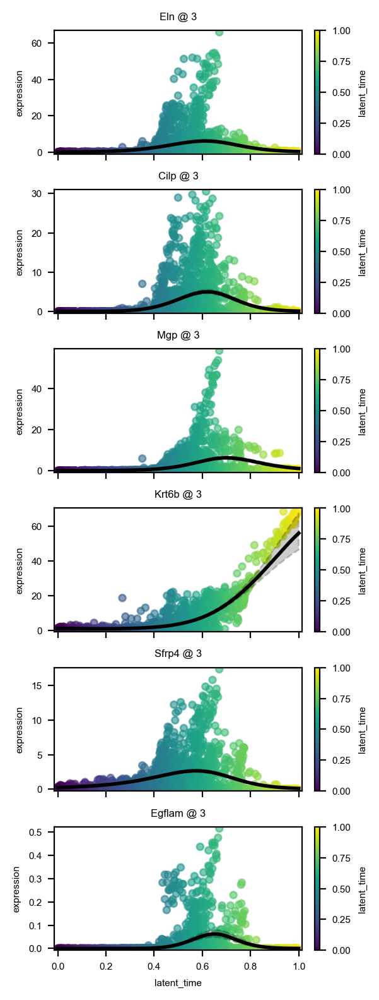

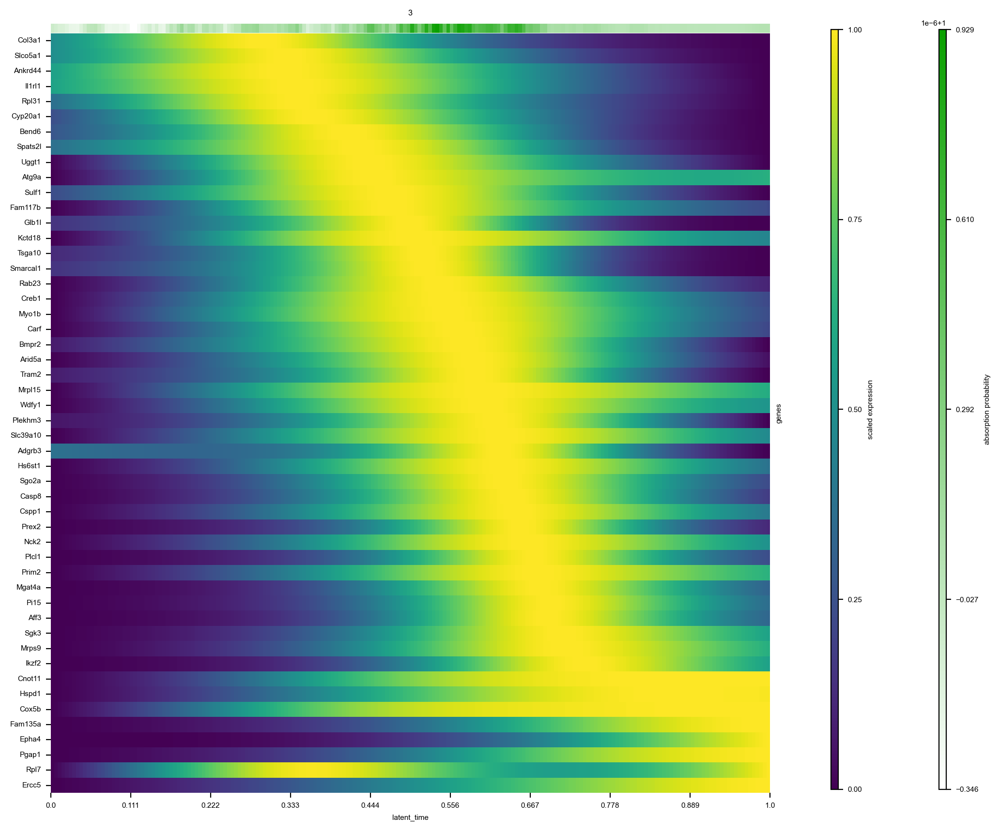

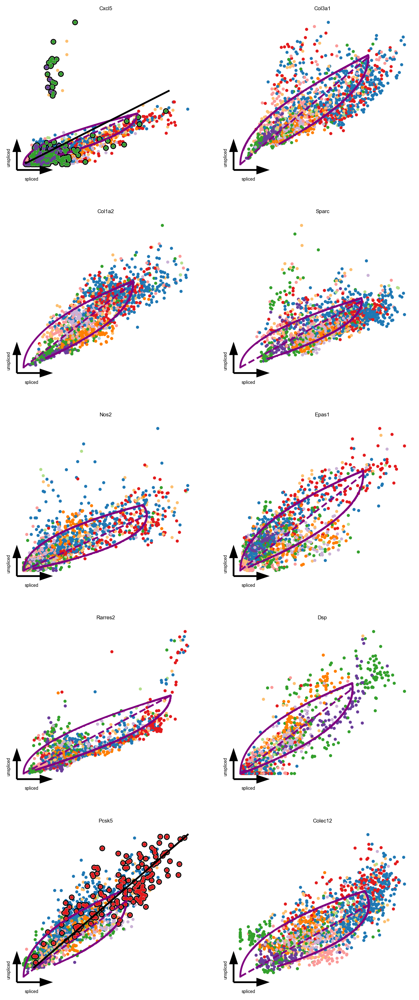

saving figure to file ./figures/fibroblast_uninfected/top_likelihood_latent.pdf


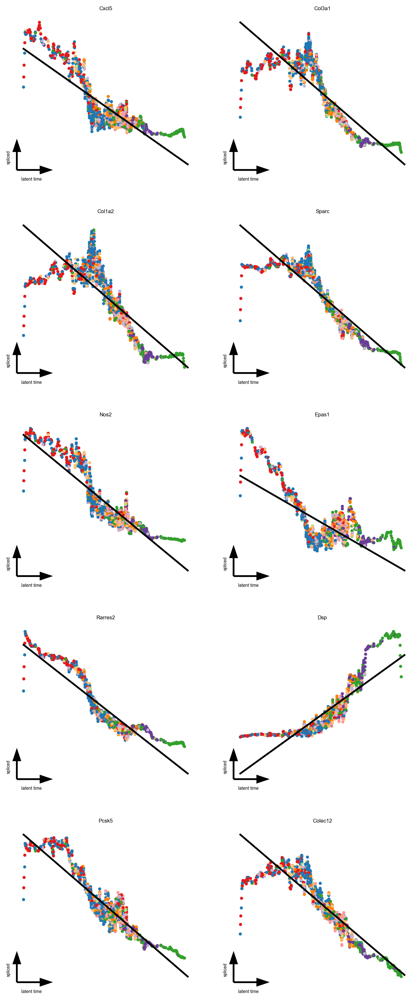

In [38]:
cr.pl.lineage_drivers(adata,
                      lineage='3',
                      n_genes=6,
                      ncols=3,
                      title_fmt='{gene} qval={qval:.2e}',
                      save='fibroblast_uninfected/lineage_drivers_rescaled.pdf',
                      color_map='Reds',
                      figsize=(7.5, 8),
                      smooth=True,
                      wspace=5
                      )

## compute DPT, starting from CellRank defined root cell
root_idx = np.where(adata.obs["initial_states"] == "5")[0][0]
adata.uns["iroot"] = root_idx
sc.tl.diffmap(adata)
sc.tl.dpt(adata)

scv.pl.scatter(adata,
               color = ["seurat_clusters", root_idx, "latent_time", "dpt_pseudotime"],
               fontsize = 16,
               cmap = "viridis",
               perc = [2, 98],
               colorbar = True,
               rescale_color = [0, 1],
               title = ["clusters", "root cell", "latent time", "dpt pseudotime"],
               save = 'root_latent_dpt.pdf'
              )

model = cr.ul.models.GAM(adata)

genes = adata.varm['terminal_lineage_drivers']["3_corr"].sort_values(ascending=False).index[:6]

cr.pl.gene_trends(adata,
                  model = model,
                  data_key = "Ms",
                  genes = genes,
                  lineages = '3',
                  time_key = "latent_time",
                  same_plot = False,
                  hide_cells = False,
                  show_progress_bar = False,
                  figsize = (3, 8),
                  gene_as_title = True,
                  cell_color = 'latent_time',
                  n_jobs = 10,
                  save = 'fibroblast_uninfected/gene_trends.pdf'
                 )

cr.pl.heatmap(adata,
              model,
              adata.var_names[:50],
              time_key = 'latent_time',
              lineages = '3',
              show_progress_bar = False,
              show_absorption_probabilities = True,
              figsize = (10, 10),
              save ='fibroblast_uninfected/latent_time.pdf',
              return_genes = False)

genes = adata.varm['terminal_lineage_drivers']["3_corr"].sort_values(ascending=False).index[:50]
scv.tl.differential_kinetic_test(adata, var_names=genes, groupby='seurat_clusters')

kwargs = dict(linewidth=2, add_linfit=True, frameon='artist')

diff_clusters=list(adata[:, genes].var['fit_diff_kinetics'])

scv.tl.recover_dynamics(adata, n_jobs=10)
top_genes = adata.var['fit_likelihood'].sort_values(ascending=False).index[:100]
scv.tl.differential_kinetic_test(adata, var_names=top_genes, groupby='seurat_clusters')

scv.pl.scatter(adata, basis=top_genes[:10], ncols=2, add_outline='fit_diff_kinetics', **kwargs, save='top_likelihood', smooth=True)
scv.pl.scatter(adata, x='latent_time', y=top_genes[:10], save='top_likelihood_latent', color='seurat_clusters', **kwargs, ncols=2, n_convolve=10, smooth=True)

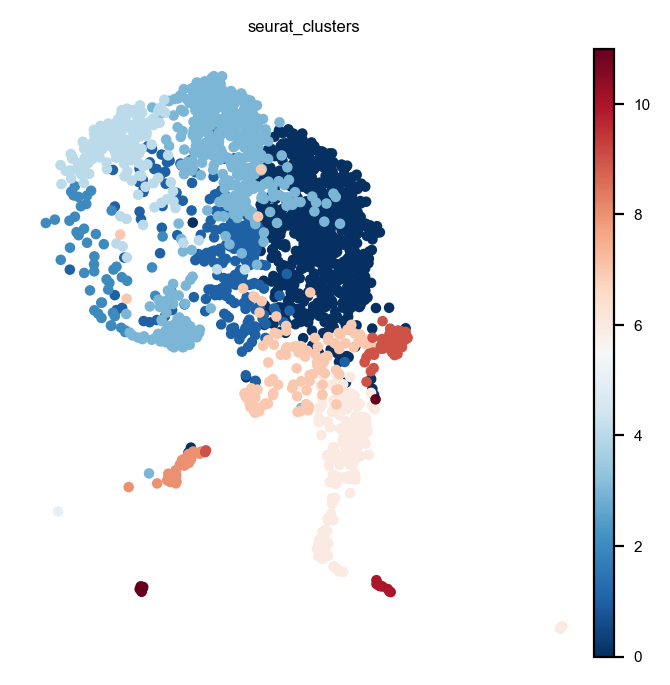

/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Filtered out 19357 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 2000 highly variable genes.
computing moments based on connectivities
    finished (0:00:00)
recovering dynamics (using 10/12 cores)


  0%|          | 0/574 [00:00<?, ?gene/s]

/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/scvelo/tools/dynamical_model.py:721: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array([dm.alpha, dm.beta, dm.gamma, dm.pars[:3]]) / dm.m[-1]
/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/scvelo/tools/dynamical_model.py:724: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array([dm.t, dm.tau, dm.t_, dm.pars[4]]) * dm.m[-1]


    finished (0:00:27)
computing velocities
    finished (0:00:01)
computing velocity graph (using 10/12 cores)


  0%|          | 0/2081 [00:00<?, ?cells/s]

/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/scvelo/core/_parallelize.py:138: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = np.array(res) if as_array else res


    finished (0:00:02)
computing velocity embedding
    finished (0:00:00)
saving figure to file ./figures/myeloid_uninfected/velocity_stream.svg


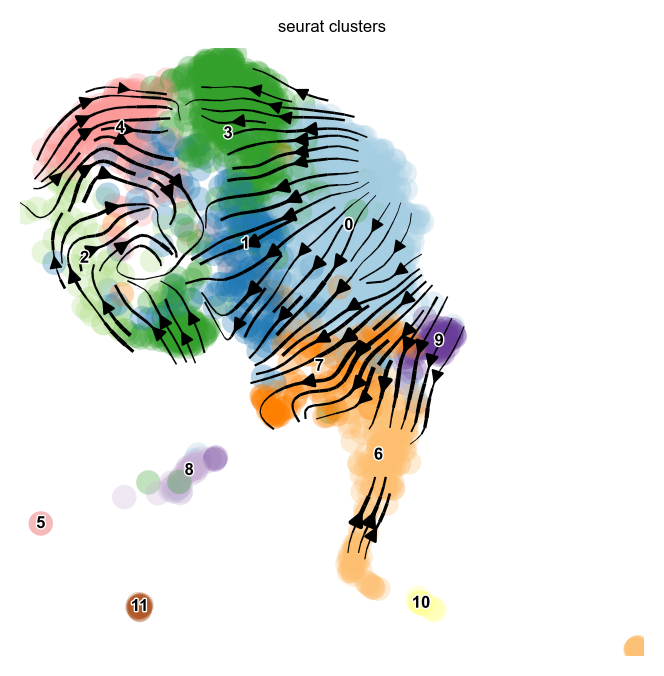

Accessing `adata.obsp['T_fwd']`
Computing transition matrix based on logits using `'deterministic'` mode
Estimating `softmax_scale` using `'deterministic'` mode


/var/folders/9b/399_qf9s3gz9j3f1l6bkpm0m0000gp/T/ipykernel_79101/136787968.py:87: DeprecationWarning: `cellrank.tl.terminal_states` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  cr.tl.terminal_states(adata,
/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/cellrank/tl/_init_term_states.py:156: DeprecationWarning: `cellrank.tl.transition_matrix` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  kernel = transition_matrix(


  0%|          | 0/2081 [00:00<?, ?cell/s]

Setting `softmax_scale=4.6272`


  0%|          | 0/2081 [00:00<?, ?cell/s]

    Finish (0:00:01)
Using a connectivity kernel with weight `0.2`
Computing transition matrix based on `adata.obsp['connectivities']`
    Finish (0:00:00)
Computing eigendecomposition of the transition matrix
Adding `adata.uns['eigendecomposition_fwd']`
       `.eigendecomposition`
    Finish (0:00:00)
For 1 macrostate, stationary distribution is computed
Adding `.macrostates`
       `.macrostates_memberships`
       `.coarse_T`
       `.coarse_initial_distribution
       `.coarse_stationary_distribution`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:00)
Adding `adata.obs['terminal_states']`
       `adata.obs['terminal_states_probs']`
       `.terminal_states`
       `.terminal_states_probabilities`
       `.terminal_states_memberships
    Finish`
Accessing `adata.obsp['T_bwd']`
Computing transition matrix based on logits using `'deterministic'` mode
Estimating `softmax_scale` using `'deterministic'` mode


/var/folders/9b/399_qf9s3gz9j3f1l6bkpm0m0000gp/T/ipykernel_79101/136787968.py:91: DeprecationWarning: `cellrank.tl.initial_states` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  cr.tl.initial_states(adata, cluster_key = 'seurat_clusters')
/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/cellrank/tl/_init_term_states.py:156: DeprecationWarning: `cellrank.tl.transition_matrix` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  kernel = transition_matrix(


  0%|          | 0/2081 [00:00<?, ?cell/s]

Setting `softmax_scale=4.6272`


  0%|          | 0/2081 [00:00<?, ?cell/s]

    Finish (0:00:02)
Using a connectivity kernel with weight `0.2`
Computing transition matrix based on `adata.obsp['connectivities']`
    Finish (0:00:00)
Computing eigendecomposition of the transition matrix
Adding `adata.uns['eigendecomposition_bwd']`
       `.eigendecomposition`
    Finish (0:00:00)
For 1 macrostate, stationary distribution is computed
Adding `.macrostates`
       `.macrostates_memberships`
       `.coarse_T`
       `.coarse_initial_distribution
       `.coarse_stationary_distribution`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:00)
Adding `adata.obs['initial_states']`
       `adata.obs['initial_states_probs']`
       `.terminal_states`
       `.terminal_states_probabilities`
       `.terminal_states_memberships
    Finish`
Computing absorption probabilities


/var/folders/9b/399_qf9s3gz9j3f1l6bkpm0m0000gp/T/ipykernel_79101/136787968.py:93: DeprecationWarning: `cellrank.tl.lineages` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  cr.tl.lineages(adata)


  0%|          | 0/1 [00:00<?, ?/s]

Adding `adata.obsm['to_terminal_states']`
       `.absorption_probabilities`
    Finish (0:00:00)
computing latent time using initial_states_probs, terminal_states_probs as prior
    finished (0:00:00)
running PAGA using priors: ['velocity_pseudotime', 'initial_states_probs', 'terminal_states_probs']
    finished (0:00:00)
Adding `adata.varm['terminal_lineage_drivers']`
       `.lineage_drivers`
    Finish (0:00:00)


/var/folders/9b/399_qf9s3gz9j3f1l6bkpm0m0000gp/T/ipykernel_79101/136787968.py:119: DeprecationWarning: `cellrank.tl.lineage_drivers` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  cr.tl.lineage_drivers(adata)


,7_corr,7_pval,7_qval,7_ci_low,7_ci_high
Cdk8,0.29,5.70e-42,1.14e-38,0.25,0.33
Slc7a11,0.24,9.90e-29,9.90e-26,0.20,0.28
Plcb1,0.21,3.78e-23,2.52e-20,0.17,0.25
Met,0.20,3.70e-21,1.48e-18,0.16,0.25
Pla2g4a,0.20,2.02e-20,6.73e-18,0.16,0.24
...,...,...,...,...,...
Lgmn,-0.14,7.19e-11,5.75e-09,-0.18,-0.10
Ccl8,-0.14,4.51e-11,3.76e-09,-0.19,-0.10
Pf4,-0.15,4.31e-12,4.54e-10,-0.19,-0.11
Ctsb,-0.19,5.23e-19,1.49e-16,-0.23,-0.15


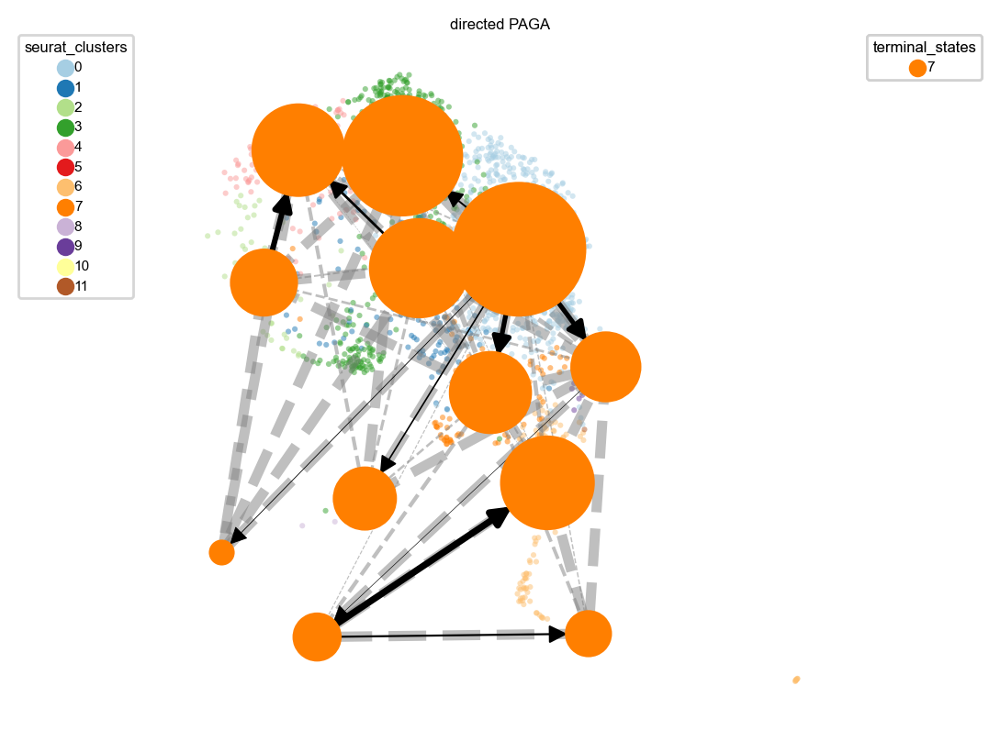

In [39]:
scv.settings.plot_prefix = 'myeloid_uninfected/'

X = io.mmread("data/uninfected_myeloid_counts.mtx")

adata = ad.AnnData(
    X=X.transpose().tocsr(), dtype=X.dtype
)

# load cell metadata pre-calculated in Seurat:
cell_meta = pd.read_csv("data/uninfected_myeloid_metadata.csv")

# load gene names pre-calculated in Seurat:
with open("data/uninfected_myeloid_gene_names.csv", 'r') as f:
    gene_names = f.read().splitlines()

# load barcodes pre-calculated in Seurat:
adata.obs = cell_meta
adata.obs.index = adata.obs['barcode']
adata.var.index = gene_names

# load dimensional reduction pre-calculated in Seurat:
pca = pd.read_csv("data/uninfected_myeloid_pca.csv")
pca.index = adata.obs.index

# set pca and umap pre-calculated in Seurat:
adata.obsm['X_pca'] = pca.to_numpy()
adata.obsm['X_umap'] = np.vstack((adata.obs['UMAP_1'].to_numpy(), adata.obs['UMAP_2'].to_numpy())).T

# plot a UMAP colored by celltypes to test:
sc.pl.umap(adata,
           color='seurat_clusters', palette=palette,
           frameon=False)

# read .loom files created in velocyto for each sample in the integrated dataset
ldata1 = scv.read('loom/uninfected_1.loom', cache=False, validate=False)
ldata2 = scv.read('loom/uninfected_2.loom', cache=False, validate=False)

# rename barcodes in order to merge
barcodes = [bc.split(':')[1] for bc in ldata1.obs.index.tolist()]
barcodes = [bc[0:len(bc)-1] + '_1' for bc in barcodes]
ldata1.obs.index = barcodes

barcodes = [bc.split(':')[1] for bc in ldata2.obs.index.tolist()]
barcodes = [bc[0:len(bc)-1] + '_2' for bc in barcodes]
ldata2.obs.index = barcodes

ldata1.var_names_make_unique()
ldata2.var_names_make_unique()

# concatenate loom data
ldata = ldata1.concatenate(ldata2)

scv.utils.clean_obs_names(adata)
scv.utils.clean_obs_names(ldata)

# merge matrices into the original adata object
adata = scv.utils.merge(adata, ldata)

# save dataset as anndata format
adata.write('adata/uninfected_myeloid.h5ad')

#adata = scv.read('adata/uninfected_myeloid.h5ad')

scv.pp.filter_and_normalize(adata, min_shared_counts=20, n_top_genes=2000)
sc.tl.pca(adata)
sc.pp.neighbors(adata, n_pcs=15, n_neighbors=30)
scv.pp.moments(adata, n_pcs=None, n_neighbors=None)

scv.tl.recover_dynamics(adata, n_jobs = 10)

scv.tl.velocity(adata, mode = 'dynamical', n_jobs = 10)
scv.tl.velocity_graph(adata, n_jobs = 10)

# save for later
adata.write('processed_adata/uninfected_myeloid.h5ad', compression='gzip')
#adata = scv.read('processed_adata/uninfected_myeloid.h5ad')

scv.pl.velocity_embedding_stream(adata,
                                 basis = 'umap',
                                 smooth = 0.8,
                                 min_mass = 4,
                                 palette = palette,
                                 color = 'seurat_clusters',
                                 save = 'velocity_stream.svg'
                                )

cr.tl.terminal_states(adata,
                      cluster_key="seurat_clusters",
                      weight_connectivities=0.2)

cr.tl.initial_states(adata, cluster_key = 'seurat_clusters')

cr.tl.lineages(adata)

# Directed PAGA
scv.tl.recover_latent_time(adata,
                           root_key="initial_states_probs",
                           end_key="terminal_states_probs")

scv.tl.paga(adata,
            groups="seurat_clusters",
            root_key="initial_states_probs",
            end_key="terminal_states_probs",
            use_time_prior="velocity_pseudotime")

cr.pl.cluster_fates(adata,
                    mode="paga_pie",
                    cluster_key="seurat_clusters",
                    basis="umap",
                    legend_kwargs={"loc": "top right out"},
                    legend_loc="top left out",
                    node_size_scale=5,
                    edge_width_scale=1,
                    max_edge_width=4,
                    title="directed PAGA",
                    save = 'myeloid_uninfected/cluster_fates.pdf'
                   )

cr.tl.lineage_drivers(adata)

/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/scvelo/plotting/utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()
/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/scvelo/plotting/utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()
/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/scvelo/plotting/utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()
/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/scvelo/plotting/utils.py:869: MatplotlibDeprecationWarning: The draw_all functi

saving figure to file ./figures/myeloid_uninfected/root_latent_dpt.pdf


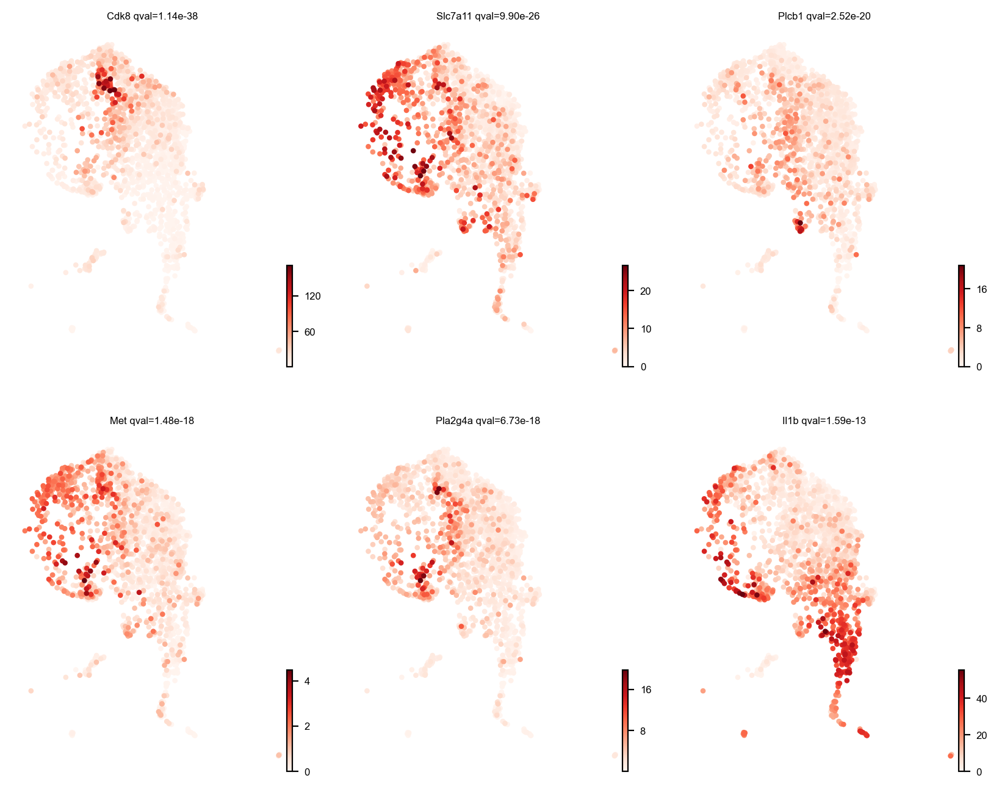

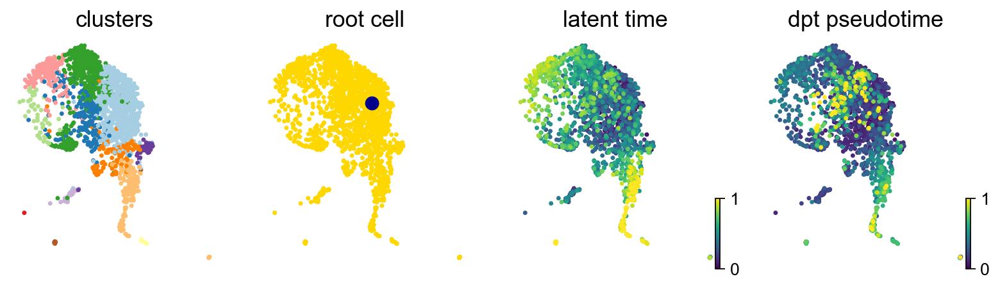

Computing trends using `10` core(s)


  0%|          | 0/6 [00:00<?, ?gene/s]

    Finish (0:00:11)
Plotting trends
Computing trends using `1` core(s)


  0%|          | 0/50 [00:00<?, ?gene/s]

/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/pygam/utils.py:649: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  bases = (x >= aug_knots[:-1]).astype(np.int) * \
/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/pygam/utils.py:650: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish

    Finish (0:00:02)


/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/pygam/utils.py:649: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  bases = (x >= aug_knots[:-1]).astype(np.int) * \
/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/pygam/utils.py:650: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish

recovering dynamics (using 1/12 cores)


  0%|          | 0/20 [00:00<?, ?gene/s]

/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/scvelo/tools/dynamical_model.py:721: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array([dm.alpha, dm.beta, dm.gamma, dm.pars[:3]]) / dm.m[-1]
/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/scvelo/tools/dynamical_model.py:724: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array([dm.t, dm.tau, dm.t_, dm.pars[4]]) * dm.m[-1]


    finished (0:00:03)
testing for differential kinetics
    finished (0:00:05)
recovering dynamics (using 10/12 cores)


  0%|          | 0/480 [00:00<?, ?gene/s]

/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/scvelo/tools/dynamical_model.py:721: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array([dm.alpha, dm.beta, dm.gamma, dm.pars[:3]]) / dm.m[-1]
/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/scvelo/tools/dynamical_model.py:724: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array([dm.t, dm.tau, dm.t_, dm.pars[4]]) * dm.m[-1]


    finished (0:00:29)
testing for differential kinetics
    finished (0:00:11)
saving figure to file ./figures/myeloid_uninfected/top_likelihood.pdf


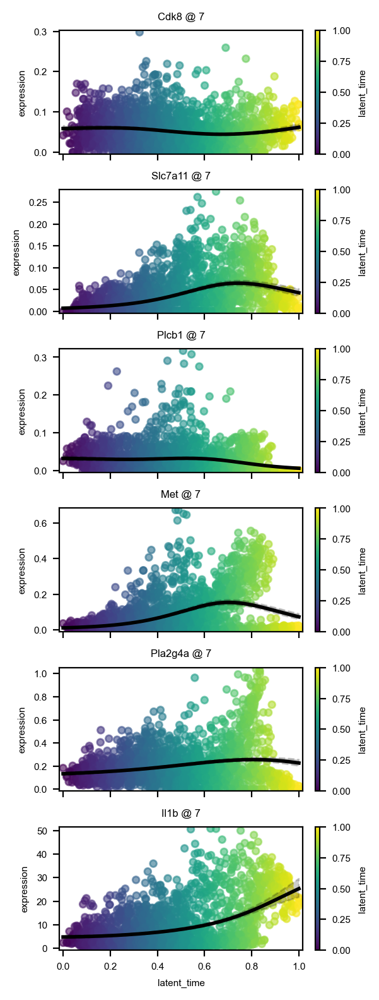

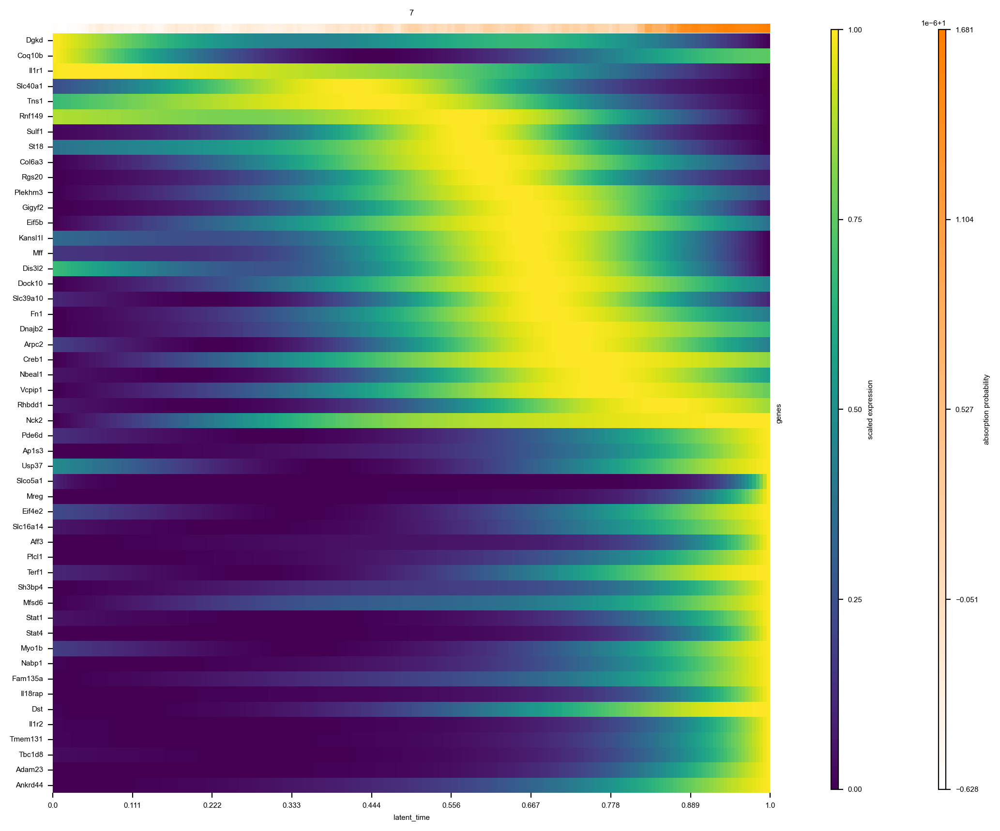

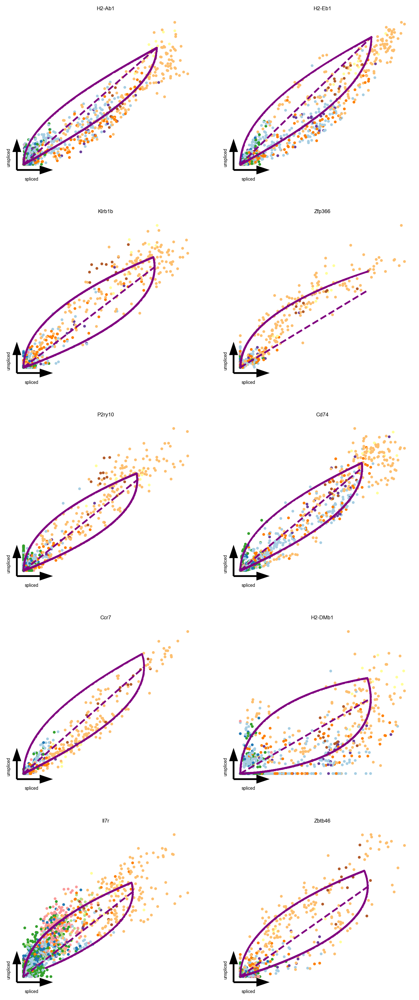

saving figure to file ./figures/myeloid_uninfected/top_likelihood_latent.pdf


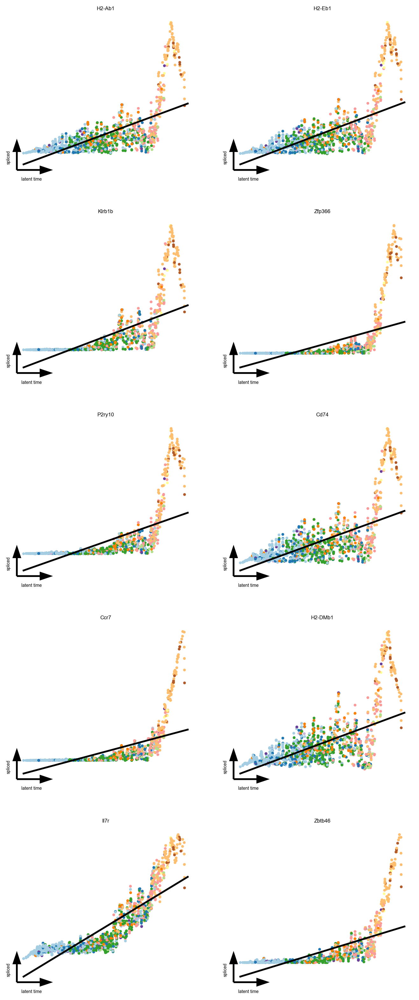

In [40]:
cr.pl.lineage_drivers(adata,
                      lineage='7',
                      n_genes=6,
                      ncols=3,
                      title_fmt='{gene} qval={qval:.2e}',
                      save='myeloid_uninfected/lineage_drivers_rescaled.pdf',
                      color_map='Reds',
                      figsize=(10, 8),
                      smooth=True,
                      wspace=5
                      )

## compute DPT, starting from CellRank defined root cell
root_idx = np.where(adata.obs["initial_states"] == "0")[0][0]
adata.uns["iroot"] = root_idx
sc.tl.diffmap(adata)
sc.tl.dpt(adata)

scv.pl.scatter(adata,
               color = ["seurat_clusters", root_idx, "latent_time", "dpt_pseudotime"],
               fontsize = 16,
               cmap = "viridis",
               perc = [2, 98],
               colorbar = True,
               rescale_color = [0, 1],
               title = ["clusters", "root cell", "latent time", "dpt pseudotime"],
               save = 'root_latent_dpt.pdf'
              )

model = cr.ul.models.GAM(adata)

genes = adata.varm['terminal_lineage_drivers']["7_corr"].sort_values(ascending=False).index[:6]

cr.pl.gene_trends(adata,
                  model = model,
                  data_key = "Ms",
                  genes = genes,
                  lineages = '7',
                  time_key = "latent_time",
                  same_plot = False,
                  hide_cells = False,
                  show_progress_bar = False,
                  figsize = (3, 8),
                  gene_as_title = True,
                  cell_color = 'latent_time',
                  n_jobs = 10,
                  save = 'myeloid_uninfected/gene_trends.pdf'
                 )

cr.pl.heatmap(adata,
              model,
              adata.var_names[:50],
              time_key = 'latent_time',
              lineages = '7',
              show_progress_bar = False,
              show_absorption_probabilities = True,
              figsize = (10, 10),
              save ='myeloid_uninfected/latent_time.pdf',
              return_genes = False)

genes = adata.varm['terminal_lineage_drivers']["7_corr"].sort_values(ascending=False).index[:50]
scv.tl.differential_kinetic_test(adata, var_names=genes, groupby='seurat_clusters')

kwargs = dict(linewidth=2, add_linfit=True, frameon='artist')

diff_clusters=list(adata[:, genes].var['fit_diff_kinetics'])

scv.tl.recover_dynamics(adata, n_jobs=10)
top_genes = adata.var['fit_likelihood'].sort_values(ascending=False).index[:100]
scv.tl.differential_kinetic_test(adata, var_names=top_genes, groupby='seurat_clusters')

scv.pl.scatter(adata, basis=top_genes[:10], ncols=2, add_outline='fit_diff_kinetics', **kwargs, save='top_likelihood', smooth=True)
scv.pl.scatter(adata, x='latent_time', y=top_genes[:10], save='top_likelihood_latent', color='seurat_clusters', **kwargs, ncols=2, n_convolve=10, smooth=True)

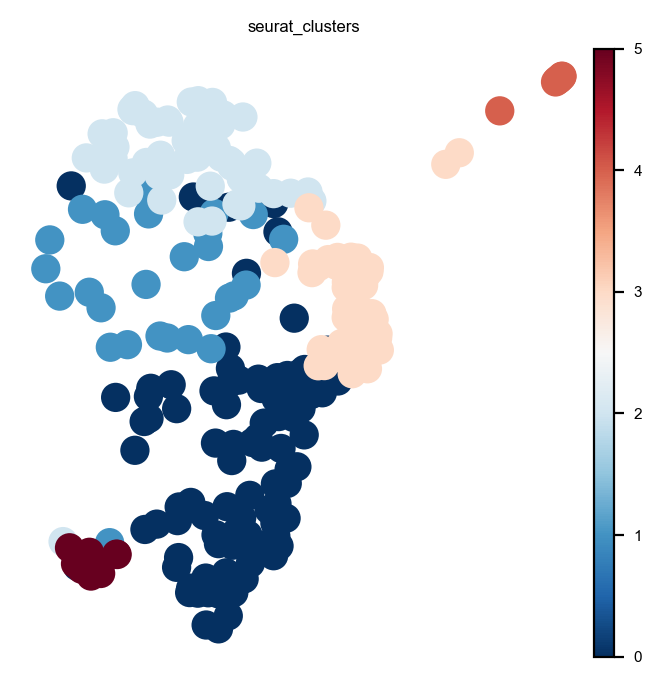

/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Filtered out 24362 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Skip filtering by dispersion since number of variables are less than `n_top_genes`.
computing moments based on connectivities
    finished (0:00:00)
recovering dynamics (using 10/12 cores)


  0%|          | 0/346 [00:00<?, ?gene/s]

    finished (0:00:05)
computing velocities
    finished (0:00:00)
computing velocity graph (using 10/12 cores)


/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/scvelo/tools/dynamical_model.py:721: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array([dm.alpha, dm.beta, dm.gamma, dm.pars[:3]]) / dm.m[-1]
/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/scvelo/tools/dynamical_model.py:724: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array([dm.t, dm.tau, dm.t_, dm.pars[4]]) * dm.m[-1]


  0%|          | 0/270 [00:00<?, ?cells/s]

/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/scvelo/core/_parallelize.py:138: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = np.array(res) if as_array else res


    finished (0:00:01)
computing velocity embedding
    finished (0:00:00)
saving figure to file ./figures/neutrophil_uninfected/velocity_stream.svg


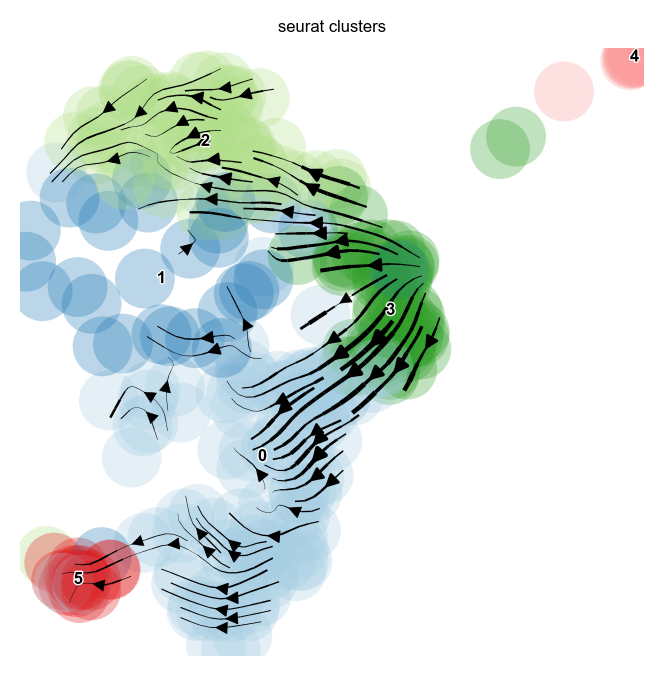

Accessing `adata.obsp['T_fwd']`
Computing transition matrix based on logits using `'deterministic'` mode
Estimating `softmax_scale` using `'deterministic'` mode


/var/folders/9b/399_qf9s3gz9j3f1l6bkpm0m0000gp/T/ipykernel_79101/3163984864.py:87: DeprecationWarning: `cellrank.tl.terminal_states` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  cr.tl.terminal_states(adata,
/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/cellrank/tl/_init_term_states.py:156: DeprecationWarning: `cellrank.tl.transition_matrix` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  kernel = transition_matrix(


  0%|          | 0/270 [00:00<?, ?cell/s]

Setting `softmax_scale=1.9320`


  0%|          | 0/270 [00:00<?, ?cell/s]

    Finish (0:00:00)
Using a connectivity kernel with weight `0.2`
Computing transition matrix based on `adata.obsp['connectivities']`
    Finish (0:00:00)
Computing eigendecomposition of the transition matrix
Adding `adata.uns['eigendecomposition_fwd']`
       `.eigendecomposition`
    Finish (0:00:00)
For 1 macrostate, stationary distribution is computed
Adding `.macrostates`
       `.macrostates_memberships`
       `.coarse_T`
       `.coarse_initial_distribution
       `.coarse_stationary_distribution`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:00)
Adding `adata.obs['terminal_states']`
       `adata.obs['terminal_states_probs']`
       `.terminal_states`
       `.terminal_states_probabilities`
       `.terminal_states_memberships
    Finish`
Accessing `adata.obsp['T_bwd']`
Computing transition matrix based on logits using `'deterministic'` mode
Estimating `softmax_scale` using `'deterministic'` mode


/var/folders/9b/399_qf9s3gz9j3f1l6bkpm0m0000gp/T/ipykernel_79101/3163984864.py:91: DeprecationWarning: `cellrank.tl.initial_states` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  cr.tl.initial_states(adata, cluster_key = 'seurat_clusters')
/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/cellrank/tl/_init_term_states.py:156: DeprecationWarning: `cellrank.tl.transition_matrix` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  kernel = transition_matrix(


  0%|          | 0/270 [00:00<?, ?cell/s]

Setting `softmax_scale=1.9320`


  0%|          | 0/270 [00:00<?, ?cell/s]

    Finish (0:00:00)
Using a connectivity kernel with weight `0.2`
Computing transition matrix based on `adata.obsp['connectivities']`
    Finish (0:00:00)
Computing eigendecomposition of the transition matrix
Adding `adata.uns['eigendecomposition_bwd']`
       `.eigendecomposition`
    Finish (0:00:00)
For 1 macrostate, stationary distribution is computed
Adding `.macrostates`
       `.macrostates_memberships`
       `.coarse_T`
       `.coarse_initial_distribution
       `.coarse_stationary_distribution`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:00)
Adding `adata.obs['initial_states']`
       `adata.obs['initial_states_probs']`
       `.terminal_states`
       `.terminal_states_probabilities`
       `.terminal_states_memberships
    Finish`
Computing absorption probabilities


/var/folders/9b/399_qf9s3gz9j3f1l6bkpm0m0000gp/T/ipykernel_79101/3163984864.py:93: DeprecationWarning: `cellrank.tl.lineages` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  cr.tl.lineages(adata)


  0%|          | 0/1 [00:00<?, ?/s]

Adding `adata.obsm['to_terminal_states']`
       `.absorption_probabilities`
    Finish (0:00:00)
computing latent time using initial_states_probs, terminal_states_probs as prior
    finished (0:00:00)
running PAGA using priors: ['velocity_pseudotime', 'initial_states_probs', 'terminal_states_probs']
    finished (0:00:00)
Adding `adata.varm['terminal_lineage_drivers']`
       `.lineage_drivers`
    Finish (0:00:00)


/var/folders/9b/399_qf9s3gz9j3f1l6bkpm0m0000gp/T/ipykernel_79101/3163984864.py:119: DeprecationWarning: `cellrank.tl.lineage_drivers` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  cr.tl.lineage_drivers(adata)


,0_corr,0_pval,0_qval,0_ci_low,0_ci_high
S100a9,0.84,3.13e-90,NaN,0.81,0.87
S100a8,0.81,1.56e-75,NaN,0.76,0.85
S100a11,0.32,6.47e-08,NaN,0.21,0.42
Prdx5,0.24,7.98e-05,NaN,0.12,0.35
Wfdc21,0.23,1.02e-04,NaN,0.12,0.34
...,...,...,...,...,...
Krt14,-0.22,1.98e-04,NaN,-0.33,-0.11
Camk1d,-0.24,6.52e-05,NaN,-0.35,-0.12
Lce1h,NaN,NaN,NaN,NaN,NaN
Lnx1,NaN,NaN,NaN,NaN,NaN


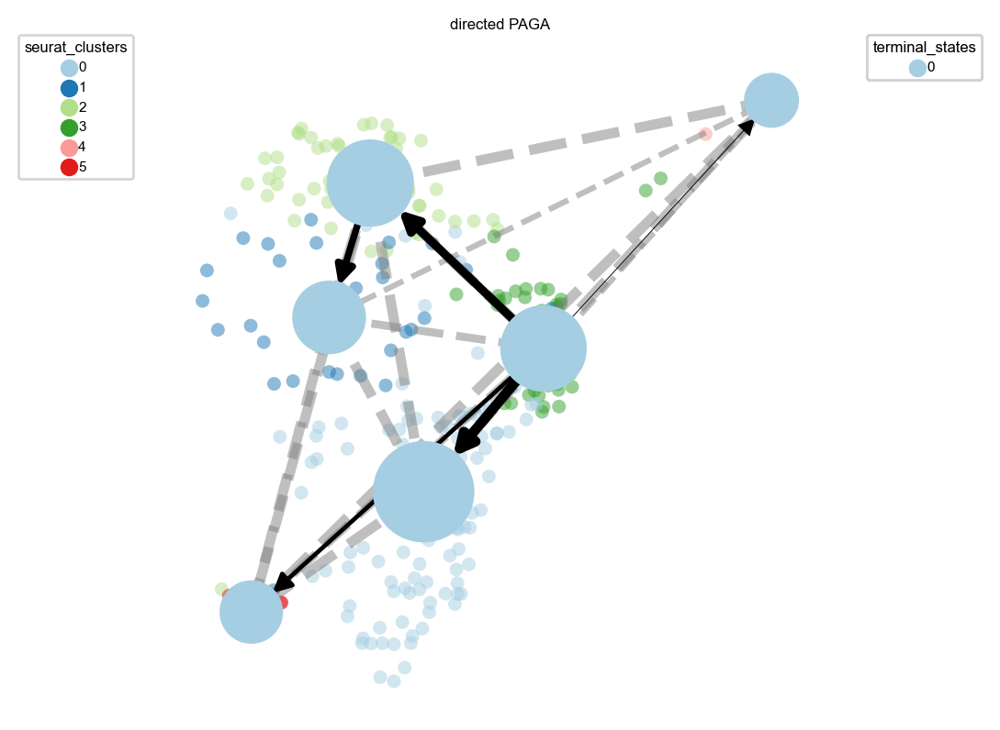

In [41]:
scv.settings.plot_prefix = 'neutrophil_uninfected/'

X = io.mmread("data/uninfected_neutrophil_counts.mtx")

adata = ad.AnnData(
    X=X.transpose().tocsr(), dtype=X.dtype
)

# load cell metadata pre-calculated in Seurat:
cell_meta = pd.read_csv("data/uninfected_neutrophil_metadata.csv")

# load gene names pre-calculated in Seurat:
with open("data/uninfected_neutrophil_gene_names.csv", 'r') as f:
    gene_names = f.read().splitlines()

# load barcodes pre-calculated in Seurat:
adata.obs = cell_meta
adata.obs.index = adata.obs['barcode']
adata.var.index = gene_names

# load dimensional reduction pre-calculated in Seurat:
pca = pd.read_csv("data/uninfected_neutrophil_pca.csv")
pca.index = adata.obs.index

# set pca and umap pre-calculated in Seurat:
adata.obsm['X_pca'] = pca.to_numpy()
adata.obsm['X_umap'] = np.vstack((adata.obs['UMAP_1'].to_numpy(), adata.obs['UMAP_2'].to_numpy())).T

# plot a UMAP colored by celltypes to test:
sc.pl.umap(adata,
           color='seurat_clusters', palette=palette,
           frameon=False)

# read .loom files created in velocyto for each sample in the integrated dataset
ldata1 = scv.read('loom/uninfected_1.loom', cache=False, validate=False)
ldata2 = scv.read('loom/uninfected_2.loom', cache=False, validate=False)

# rename barcodes in order to merge
barcodes = [bc.split(':')[1] for bc in ldata1.obs.index.tolist()]
barcodes = [bc[0:len(bc)-1] + '_1' for bc in barcodes]
ldata1.obs.index = barcodes

barcodes = [bc.split(':')[1] for bc in ldata2.obs.index.tolist()]
barcodes = [bc[0:len(bc)-1] + '_2' for bc in barcodes]
ldata2.obs.index = barcodes

ldata1.var_names_make_unique()
ldata2.var_names_make_unique()

# concatenate loom data
ldata = ldata1.concatenate(ldata2)

scv.utils.clean_obs_names(adata)
scv.utils.clean_obs_names(ldata)

# merge matrices into the original adata object
adata = scv.utils.merge(adata, ldata)

# save dataset as anndata format
adata.write('adata/uninfected_neutrophil.h5ad')

#adata = scv.read('adata/uninfected_neutrophil.h5ad')

scv.pp.filter_and_normalize(adata, min_shared_counts=20, n_top_genes=2000)
sc.tl.pca(adata)
sc.pp.neighbors(adata, n_pcs=15, n_neighbors=30)
scv.pp.moments(adata, n_pcs=None, n_neighbors=None)

scv.tl.recover_dynamics(adata, n_jobs = 10)

scv.tl.velocity(adata, mode = 'dynamical', n_jobs = 10)
scv.tl.velocity_graph(adata, n_jobs = 10)

# save for later
adata.write('processed_adata/uninfected_neutrophil.h5ad', compression='gzip')
#adata = scv.read('processed_adata/uninfected_neutrophil.h5ad')

scv.pl.velocity_embedding_stream(adata,
                                 basis = 'umap',
                                 smooth = 0.8,
                                 min_mass = 4,
                                 palette = palette,
                                 color = 'seurat_clusters',
                                 save = 'velocity_stream.svg'
                                )

cr.tl.terminal_states(adata,
                      cluster_key="seurat_clusters",
                      weight_connectivities=0.2)

cr.tl.initial_states(adata, cluster_key = 'seurat_clusters')

cr.tl.lineages(adata)

# Directed PAGA
scv.tl.recover_latent_time(adata,
                           root_key="initial_states_probs",
                           end_key="terminal_states_probs")

scv.tl.paga(adata,
            groups="seurat_clusters",
            root_key="initial_states_probs",
            end_key="terminal_states_probs",
            use_time_prior="velocity_pseudotime")

cr.pl.cluster_fates(adata,
                    mode="paga_pie",
                    cluster_key="seurat_clusters",
                    basis="umap",
                    legend_kwargs={"loc": "top right out"},
                    legend_loc="top left out",
                    node_size_scale=5,
                    edge_width_scale=1,
                    max_edge_width=4,
                    title="directed PAGA",
                    save = 'neutrophil_uninfected/cluster_fates.pdf'
                   )

cr.tl.lineage_drivers(adata)

/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/scvelo/plotting/utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()
/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/scvelo/plotting/utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()
/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/scvelo/plotting/utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()
/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/scvelo/plotting/utils.py:869: MatplotlibDeprecationWarning: The draw_all functi

saving figure to file ./figures/neutrophil_uninfected/root_latent_dpt.pdf


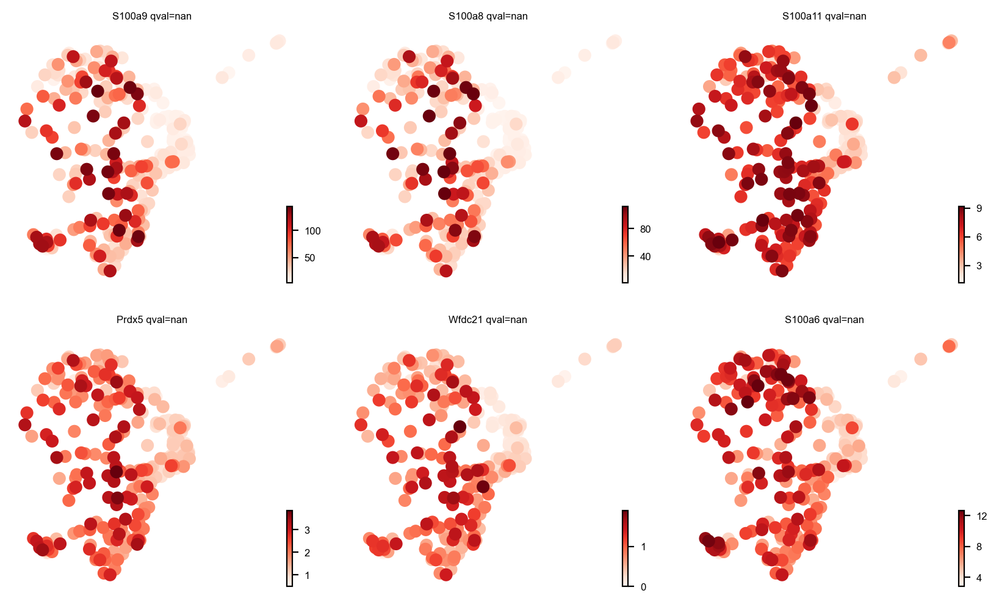

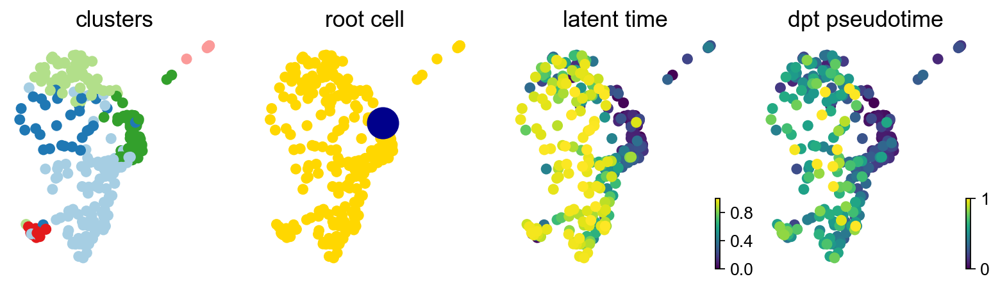

Computing trends using `10` core(s)


  0%|          | 0/6 [00:00<?, ?gene/s]

    Finish (0:00:06)
Plotting trends
Computing trends using `1` core(s)


  0%|          | 0/50 [00:00<?, ?gene/s]

/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/pygam/utils.py:649: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  bases = (x >= aug_knots[:-1]).astype(np.int) * \
/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/pygam/utils.py:650: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish

    Finish (0:00:01)


/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/pygam/utils.py:649: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  bases = (x >= aug_knots[:-1]).astype(np.int) * \
/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/pygam/utils.py:650: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish

recovering dynamics (using 1/12 cores)


  0%|          | 0/19 [00:00<?, ?gene/s]

/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/scvelo/tools/dynamical_model.py:721: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array([dm.alpha, dm.beta, dm.gamma, dm.pars[:3]]) / dm.m[-1]
/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/scvelo/tools/dynamical_model.py:724: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array([dm.t, dm.tau, dm.t_, dm.pars[4]]) * dm.m[-1]


    finished (0:00:01)
testing for differential kinetics
    finished (0:00:01)
recovering dynamics (using 10/12 cores)


  0%|          | 0/286 [00:00<?, ?gene/s]

/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/scvelo/tools/dynamical_model.py:721: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array([dm.alpha, dm.beta, dm.gamma, dm.pars[:3]]) / dm.m[-1]
/Users/cenk/.virtualenvs/rna_velocity/lib/python3.9/site-packages/scvelo/tools/dynamical_model.py:724: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array([dm.t, dm.tau, dm.t_, dm.pars[4]]) * dm.m[-1]


    finished (0:00:09)
testing for differential kinetics
    finished (0:00:03)
saving figure to file ./figures/neutrophil_uninfected/top_likelihood.pdf


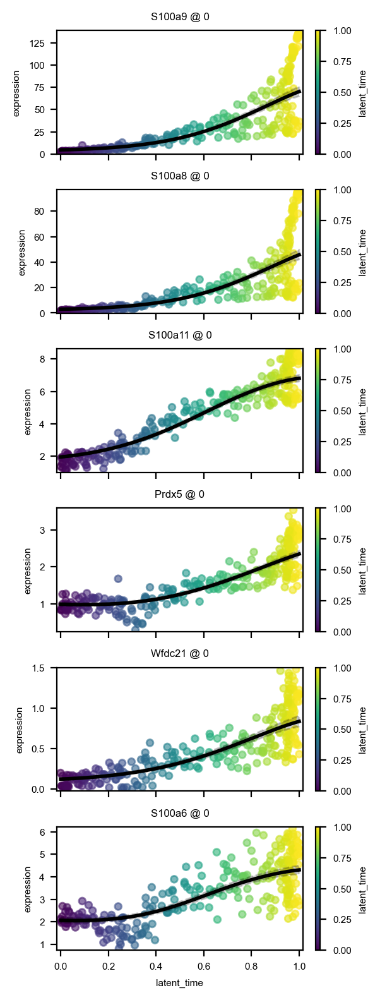

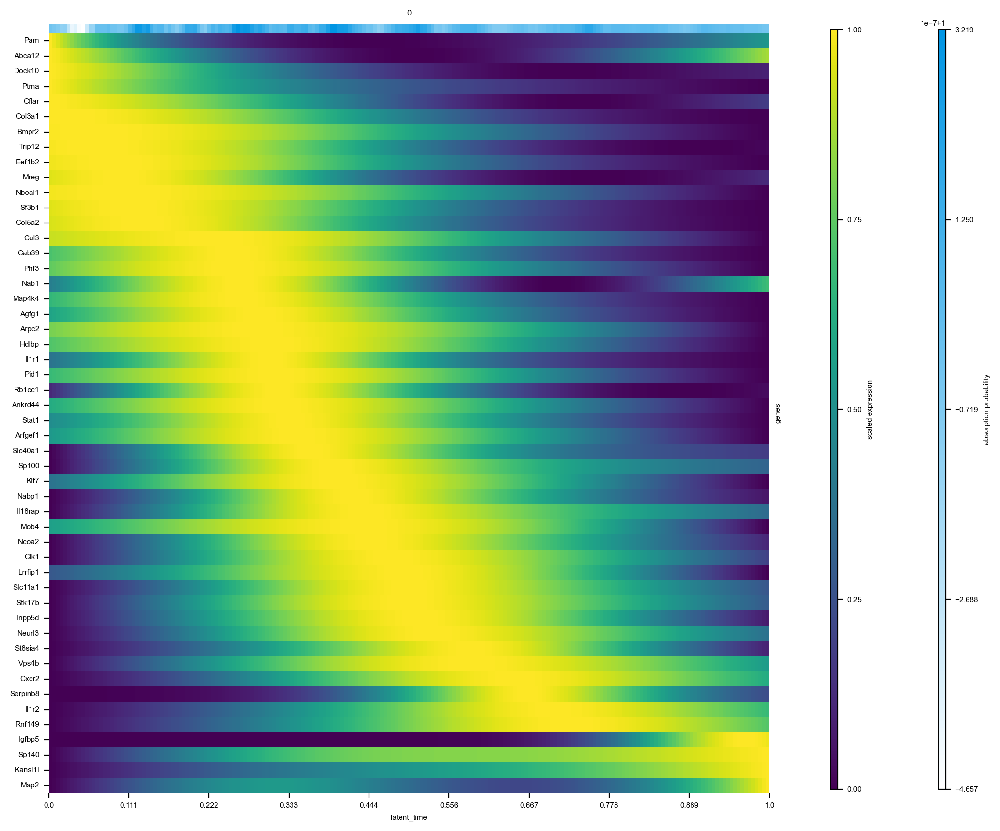

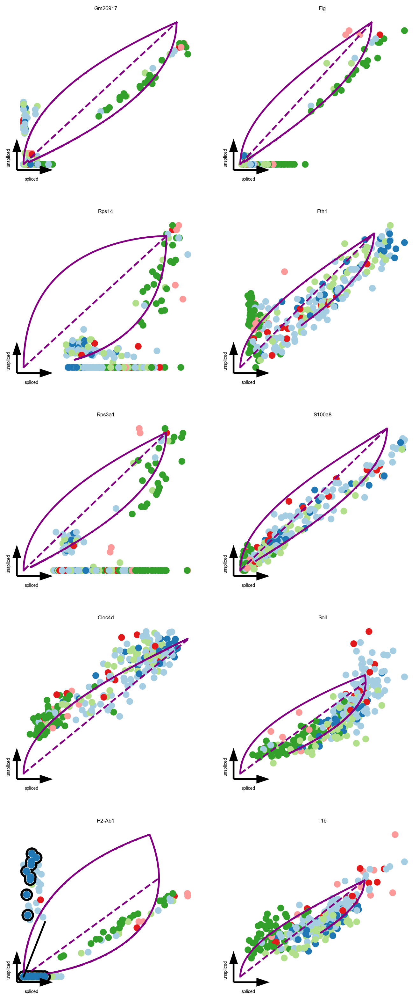

saving figure to file ./figures/neutrophil_uninfected/top_likelihood_latent.pdf


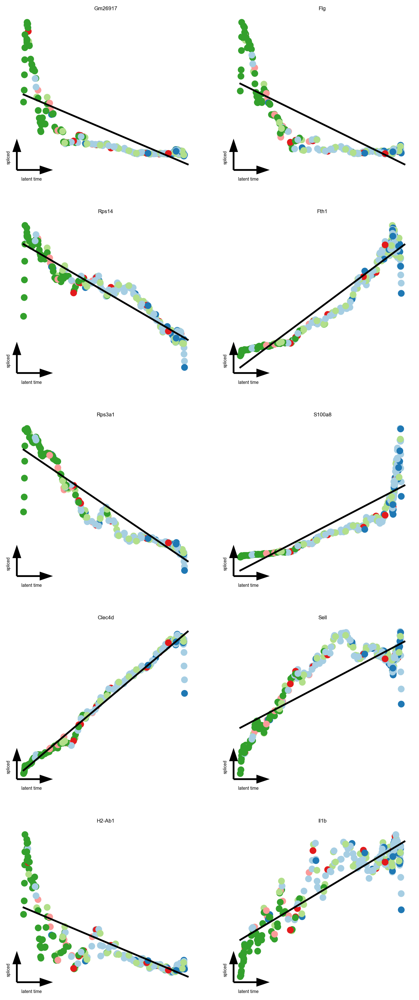

In [42]:

cr.pl.lineage_drivers(adata,
                      lineage='0',
                      n_genes=6,
                      ncols=3,
                      title_fmt='{gene} qval={qval:.2e}',
                      save='neutrophil_uninfected/lineage_drivers_rescaled.pdf',
                      color_map='Reds',
                      figsize=(10, 6),
                      smooth=True,
                      wspace=5
                      )

## compute DPT, starting from CellRank defined root cell
root_idx = np.where(adata.obs["initial_states"] == "3")[0][0]
adata.uns["iroot"] = root_idx
sc.tl.diffmap(adata)
sc.tl.dpt(adata)

scv.pl.scatter(adata,
               color = ["seurat_clusters", root_idx, "latent_time", "dpt_pseudotime"],
               fontsize = 16,
               cmap = "viridis",
               perc = [2, 98],
               colorbar = True,
               rescale_color = [0, 1],
               title = ["clusters", "root cell", "latent time", "dpt pseudotime"],
               save = 'root_latent_dpt.pdf'
              )

model = cr.ul.models.GAM(adata)

genes = adata.varm['terminal_lineage_drivers']["0_corr"].sort_values(ascending=False).index[:6]

cr.pl.gene_trends(adata,
                  model = model,
                  data_key = "Ms",
                  genes = genes,
                  lineages = '0',
                  time_key = "latent_time",
                  same_plot = False,
                  hide_cells = False,
                  show_progress_bar = False,
                  figsize = (3, 8),
                  gene_as_title = True,
                  cell_color = 'latent_time',
                  n_jobs = 10,
                  save = 'neutrophil_uninfected/gene_trends.pdf'
                 )

cr.pl.heatmap(adata,
              model,
              adata.var_names[:50],
              time_key = 'latent_time',
              lineages = '0',
              show_progress_bar = False,
              show_absorption_probabilities = True,
              figsize = (10, 10),
              save ='neutrophil_uninfected/latent_time.pdf',
              return_genes = False)

genes = adata.varm['terminal_lineage_drivers']["0_corr"].sort_values(ascending=False).index[:50]
scv.tl.differential_kinetic_test(adata, var_names=genes, groupby='seurat_clusters')

kwargs = dict(linewidth=2, add_linfit=True, frameon='artist')

diff_clusters=list(adata[:, genes].var['fit_diff_kinetics'])

scv.tl.recover_dynamics(adata, n_jobs=10)
top_genes = adata.var['fit_likelihood'].sort_values(ascending=False).index[:100]
scv.tl.differential_kinetic_test(adata, var_names=top_genes, groupby='seurat_clusters')

scv.pl.scatter(adata, basis=top_genes[:10], ncols=2, add_outline='fit_diff_kinetics', **kwargs, save='top_likelihood', smooth=True)
scv.pl.scatter(adata, x='latent_time', y=top_genes[:10], save='top_likelihood_latent', color='seurat_clusters', **kwargs, ncols=2, n_convolve=10, smooth=True)

In [43]:
import session_info
session_info.show()